<a href="https://colab.research.google.com/github/banghj-kr/python/blob/Driving_Simulation/Driving_Simulation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 0. 설명

## 1. 기본 설정
#### [코드] 00-1. 필요한 라이브러리 로드 및 함수 정의
- **필수 Python 라이브러리 로드:** pandas, numpy, matplotlib 등
- **데이터 처리 워크플로우를 간소화:** 실행 환경 확인, 데이터 저장 및 파일 경로 생성을 위한 함수 정의

#### [코드] 00-2. 폰트 설정
- **폰트 설정:** 일관된 시각화를 위해 "Times New Roman"를 기본 폰트로 설정
- **실행 환경별 작동:** 하나의 코드로 Google Colab이나 로컬 Jupyter Notebook 환경 모두에서 작동

## 2. 데이터 입력 및 전처리

### 2-1. 일직 방면 (Southbound)

#### [코드] 01-1. 일직 방면 주행 속도 데이터 입력 및 설정
- **데이터 읽기:** CSV 파일에서 일직 방면 주행 속도 데이터 로드
- **보간:** 데이터 일관성을 위해 5m 단위로 선형 보간 수행
- **평균 속도 및 가속도 계산:** 모든 지점에 대하여 평균 주행 속도, 가속도 및 누적 주행 시간 계산

#### [코드] 01-2. 일직 방면 도로편측 데이터 입력 및 설정
- **데이터 읽기:** CSV 파일에서 일직 방면 도로편측 데이터 로드
- **양수 값으로 변환:** 모든 도로편측 데이터를 양수로 변환
- **보간 및 평균 계산:** 5m 단위로 선형 보간을 수행하고 평균 도로편측 계산

#### [코드] 01-3. 종단곡선 데이터 입력 및 설정
- **데이터 읽기:** CSV 파일에서 종단곡선 데이터 로드
- **보간:** 5m 단위로 선형 보간 수행

#### [코드] 01-4. 일직 방면 데이터 프레임 병합
- **데이터 병합:** 처리된 일직 방면 주행 속도, 도로편측 및 종단곡선 데이터를 하나의 데이터 프레임으로 병합
- **데이터 저장:** 병합된 데이터 프레임을 CSV 및 Parquet 형식으로 저장

### 2-2. 성산 방면 (Northbound)

#### [코드] 02-1. 성산 방면 주행 속도 데이터 입력 및 설정
- **데이터 읽기:** CSV 파일에서 성산 방면 주행 속도 데이터 로드
- **보간 및 계산:** 5m 단위로 선형 보간을 수행하고 평균 주행 속도, 가속도 및 누적 주행 시간 계산

#### [코드] 02-2. 성산 방면 도로편측 데이터 입력 및 설정
- **데이터 읽기:** CSV 파일에서 성산 방면 도로편측 데이터 로드
- **데이터 처리:** 모든 도로편측 데이터를 양수로 변환, 5m 단위 선형 보간을 수행하고 평균 도로편측 계산

#### [코드] 02-3. 성산 방면 데이터 프레임 병합
- **데이터 병합:** 처리된 성산 방면 주행 속도, 도로편측 및 종단곡선 데이터를 하나의 데이터 프레임으로 병합
- **데이터 저장:** 병합된 데이터 프레임을 CSV 및 Parquet 형식으로 저장

## 3. 시각화

#### [코드] 03-1. 시각화를 위한 데이터 로드
- **데이터 로드:** 시각화를 위해 Parquet 파일에서 병합된 일직 방면 및 성산 방면 데이터 프레임 로드

#### [코드] 03-2. 일직 방면 위험 구간 분석
- **위험 구간 분석:** 감속 구간 및 높은 도로편측 구간 식별
- **시각화:** 주행 속도, 가속도 및 도로편측을 표시하고 위험 구간을 추가로 표시

#### [코드] 03-3. 주행 시간 기준 일직 방면 데이터 시각화
- **주행 시간별 시각화:** 지점 대신 누적 주행 시간을 기준으로 데이터 시각화

#### [코드] 03-4. 성산 방면 위험 구간 분석
- **위험 구간 분석:** 감속 구간 및 높은 도로편측 구간 식별
- **시각화:** 식별된 위험 구간 표시

#### [코드] 03-5. 주행 시간 기준 성산 방면 데이터 시각화
- **주행 시간별 시각화:** 지점 대신 누적 주행 시간을 기준으로 데이터 시각화

# 1. 기본 설정

In [1]:
# 00-1. 필요한 라이브러리 로딩 및 함수 정의 (240801)
print("00-1. 필요한 라이브정의 로딩 및 함수 정의")
#!pip install gspread google-auth
# 필요한 라이브러리 로딩
import pandas as pd
import numpy as np
import math
import os
from datetime import datetime
import traceback
import pytz
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.font_manager as fm
import matplotlib.ticker as ticker
from IPython import get_ipython

def check_environment():
    try:
        if 'google.colab' in env:
            from google.colab import data_table
            from google.auth.transport.requests import Request
            from google.oauth2.service_account import Credentials
            from google.colab import drive

            # 구글 드라이브 마운트 - Colab 환경 only
            drive.mount('/content/drive')

            # 데이터프레임을 구글 코랩의 데이터 테이블로 출력 활성화 - Colab 환경 only
            data_table.enable_dataframe_formatter()

            # 기본 경로 설정
            base_path = '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/'  # Colab 환경
            return base_path

        elif 'ZMQInteractiveShell' in env:
            # 기본 경로 설정
            base_path = ''  # Jupyter 환경
            return base_path
        else:
            return None
    except ImportError:
        return None

# 서울 시간대 설정
tz = pytz.timezone('Asia/Seoul')

# 환경에 맞는 기본 경로 설정
env = str(get_ipython())  # 실행 환경 확인
base_path = check_environment()
print(f"  - 기본 경로를 '{base_path}'로 설정하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# pandas display 옵션 설정
pd.set_option('display.max_columns', 12)
pd.set_option('display.max_rows', 100)

# 필요한 함수 정의

# 데이터프레임을 CSV 파일로 저장하는 함수 정의
def save_to_csv(df, output_file_path):
    df.to_csv(output_file_path, encoding='utf-8-sig', index=False)
    print(f"  * '{output_file_path}' 파일에 데이터를 저장하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# 데이터프레임을 Parquet 파일로 저장하는 함수 정의
def save_to_parquet(df, output_file_path):
    df.to_parquet(output_file_path, index=False)
    print(f"  * '{output_file_path}' 파일에 데이터를 저장하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# 파일 경로 및 이름 설정 함수 정의
def generate_file_path(mode, base_path, sub_dir, file_name, ext, add_timestamp=True):
    if mode == 'input':
        # 입력 파일 경로 설정 (타임스탬프 없이)
        return f'{base_path}{sub_dir}/{file_name}.{ext}'
    elif mode == 'output':
        # 출력 파일 경로 설정 (타임스탬프 추가 가능)
        output_file_path = f'{base_path}{sub_dir}/{file_name}.{ext}'
        if add_timestamp:
            date_str = datetime.now(tz).strftime("%Y%m%d.%H%M%S")
            output_file_path = f"{os.path.splitext(output_file_path)[0]}_{date_str}.{ext}"
        return output_file_path
    else:
        raise ValueError("  * 파일의 경로와 이름을 설정하는 함수의 첫 번째 매개변수는 'input' 또는 'output'으로 설정해주세요.")

print(f"  - 라이브러리 로딩 및 함수 정의를 완료하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# ==================================================

00-1. 필요한 라이브정의 로딩 및 함수 정의
Mounted at /content/drive
  - 기본 경로를 '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/'로 설정하였습니다. (2024-08-02 12:35:52)
  - 라이브러리 로딩 및 함수 정의를 완료하였습니다. (2024-08-02 12:35:52)


In [2]:
# 00-2. 글꼴(Times New Roman) 설정 (240801)
print("00-2. 글꼴(Times New Roman) 설정")

def set_font(env):
    if 'google.colab' in env:
        # 폰트 파일을 시스템 폰트 디렉토리로 복사
        !cp /content/drive/MyDrive/Colab\ Notebooks/Fonts/Times_New_Roman/*.ttf /usr/share/fonts/truetype/

        # 폰트 디렉토리 확인
        print(f"  - 설치된 폰트 목록 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
        !ls /usr/share/fonts/truetype/

        # 폰트 캐시 재빌드
        fm._load_fontmanager(try_read_cache=False)

        # Times New Roman 폰트 경로 설정
        font_path_regular = '/usr/share/fonts/truetype/times.ttf'
        font_path_bold = '/usr/share/fonts/truetype/timesbd.ttf'

        print(f"  - Google Colab 환경에서 Times New Roman 폰트를 사용합니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

    elif 'ZMQInteractiveShell' in env:
        # Times New Roman 폰트 경로 설정
        font_path_regular = 'C:\\Windows\\Fonts\\times.ttf'
        font_path_bold = 'C:\\Windows\\Fonts\\timesbd.ttf'

        print(f"  - Jupyter 환경에서 Times New Roman 폰트를 사용합니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

    # 설치된 폰트 목록 확인
    font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')

    # 폰트 목록 출력
    print(f"\n  - 설치된 폰트 위치 목록 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
    for font in font_list:
        print(font)

    # Times New Roman 폰트를 설정
    times_font = fm.FontProperties(fname=font_path_regular)
    times_bold_font = fm.FontProperties(fname=font_path_bold)

    # Times New Roman을 기본 폰트로 설정
    plt.rcParams['font.family'] = times_font.get_name()
    print(f"\n  - Times New Roman을 기본 폰트로 설정하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

    return times_font, times_bold_font

# 환경에 따라 폰트 설정
times_font, times_bold_font = set_font(env)

# ==================================================

00-2. 글꼴(Times New Roman) 설정
  - 설치된 폰트 목록 (2024-08-02 12:35:54)
humor-sans  liberation	timesbd.ttf  timesbi.ttf  timesi.ttf  times.ttf
  - Google Colab 환경에서 Times New Roman 폰트를 사용합니다. (2024-08-02 12:35:55)

  - 설치된 폰트 위치 목록 (2024-08-02 12:35:55)
/usr/share/fonts/truetype/liberation/LiberationMono-Italic.ttf
/usr/share/fonts/truetype/liberation/LiberationMono-BoldItalic.ttf
/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Italic.ttf
/usr/share/fonts/truetype/liberation/LiberationMono-Bold.ttf
/usr/share/fonts/truetype/liberation/LiberationSans-Bold.ttf
/usr/share/fonts/truetype/liberation/LiberationSerif-Regular.ttf
/usr/share/fonts/truetype/times.ttf
/usr/share/fonts/truetype/liberation/LiberationSans-BoldItalic.ttf
/usr/share/fonts/truetype/timesi.ttf
/usr/share/fonts/truetype/humor-sans/Humor-Sans.ttf
/usr/share/fonts/truetype/liberation/LiberationSansNarrow-BoldItalic.ttf
/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf
/usr/share/fonts/truetype/timesb

# 2. 데이터 입력 및 전처리

## 2-1. 일직 방면

In [3]:
# 01-1. Southbound Travel Speed 입력 및 설정 (240728)
print("01-1. Southbound Travel Speed 입력 및 설정")

# 파일 경로 및 이름, 시트 이름 설정
input_file_path = generate_file_path('input', base_path, 'Data', 'southbound_travel_speed', 'csv')  # 입력 파일 경로 및 이름 설정
output_file_path = generate_file_path('output', base_path, 'Output', 'southbound_travel_speed', 'csv')  # 출력 파일 경로 및 이름 설정

if not os.path.exists(input_file_path):  # 파일 존재 여부 확인
    print(f"  - Error: '{input_file_path}' 파일을 찾을 수 없습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
else:
    try:
        # CSV 파일을 읽어 데이터프레임으로 변환
        sb_speed_df = pd.read_csv(input_file_path)
        print(f"  - '{input_file_path}' 파일을 읽었습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        print(f"  - 읽어온 데이터 확인 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        # 읽어온 데이터프레임 확인
        print("    * Southbound Travel Speed (sb_speed_df):")
        display(sb_speed_df)

        # 데이터프레임 구조 확인
        print("\n    * Southbound Travel Speed DataFrame Information (sb_speed_df):")
        display(sb_speed_df.info())

        # travel_distance 최소값과 최대값 사이의 중간값을 선형보간법으로 추가
        min_distance = sb_speed_df['travel_distance'].min()
        max_distance = sb_speed_df['travel_distance'].max()
        all_distances = pd.Series(range(min_distance, max_distance + 5, 5))

        sb_speed_df = sb_speed_df.set_index('travel_distance').reindex(all_distances).interpolate().reset_index().rename(columns={'index': 'travel_distance'})

        print(f"\n  - travel_distance의 중간값을 선형보간법으로 추가하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        # 1~11번 주행속도의 평균값을 계산하여 새로운 열 travel_speed_12에 저장
        speed_columns_original = [f'travel_speed_{i}' for i in range(1, 12)]
        sb_speed_df['travel_speed_12'] = sb_speed_df[speed_columns_original].mean(axis=1)

        # 속도 열 목록
        speed_columns = [f'travel_speed_{i}' for i in range(1, 13)]

        # 집합화된 속도 열 목록 생성 및 평균 계산
        for col in speed_columns:
            sb_speed_df[f'{col}_agr'] = sb_speed_df[col].rolling(window=21, center=True).mean()

        # 집합화된 속도 열 목록
        agr_speed_columns = [f'{col}_agr' for col in speed_columns]

        # 모든 속도 열에 대한 주행 시간과 가속도를 계산하고 원본 데이터프레임에 추가
        additional_cols = {}
        for col in speed_columns + agr_speed_columns:
            additional_cols[f'{col}_prev_travel_distance'] = sb_speed_df['travel_distance'].shift(1)
            additional_cols[f'{col}_prev_speed'] = sb_speed_df[col].shift(1)

            # 거리 차이 (m)
            additional_cols[f'{col}_distance_diff'] = sb_speed_df['travel_distance'] - additional_cols[f'{col}_prev_travel_distance']

            # 평균 속도 (km/h)
            additional_cols[f'{col}_average_speed'] = (sb_speed_df[col] + additional_cols[f'{col}_prev_speed']) / 2

            # 소요 시간 (min)
            additional_cols[f'{col}_time_diff_min'] = (additional_cols[f'{col}_distance_diff'] / 1000) / additional_cols[f'{col}_average_speed'] * 60

            # 가속도 (m/s^2)
            # km/h -> m/s 변환: 1 km/h = 1000/3600 m/s = 5/18 m/s
            speed_m_per_s = sb_speed_df[col] * (5/18)
            prev_speed_m_per_s = additional_cols[f'{col}_prev_speed'] * (5/18)
            time_diff_s = additional_cols[f'{col}_time_diff_min'] * 60

            additional_cols[f'{col}_acceleration'] = (speed_m_per_s - prev_speed_m_per_s) / time_diff_s

            # 누적 소요 시간 (min)
            cumulative_time_col = f'{col}_cumulative_time_min'
            if cumulative_time_col not in additional_cols:
                additional_cols[cumulative_time_col] = additional_cols[f'{col}_time_diff_min'].cumsum()
            else:
                additional_cols[cumulative_time_col] += additional_cols[f'{col}_time_diff_min']

        # 추가 열을 데이터프레임에 병합
        additional_df = pd.DataFrame(additional_cols)
        sb_speed_df = pd.concat([sb_speed_df, additional_df], axis=1)

        print(f"  - 입력된 속도 데이터를 이용해 지점별 가속도와 누적 소요 시간을 계산하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        # 최종 데이터프레임에서 불필요한 열 제거
        columns_to_drop = []
        for col in speed_columns + agr_speed_columns:
            columns_to_drop.extend([f'{col}_prev_travel_distance', f'{col}_prev_speed', f'{col}_distance_diff', f'{col}_average_speed'])

        sb_speed_df.drop(columns=columns_to_drop + agr_speed_columns, inplace=True)

        print(f"  - 계산 과정에 사용된 불필요한 열을 삭제하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        # 열 이름 변경
        for i in range(1, 13):
            suffix = 'avg' if i == 12 else i
            sb_speed_df.rename(columns={
                f'travel_speed_{i}': f'travel_speed_kph_{suffix}',
                f'travel_speed_{i}_time_diff_min': f'time_diff_min_{suffix}',
                f'travel_speed_{i}_acceleration': f'acceleration_m_per_s2_{suffix}',
                f'travel_speed_{i}_cumulative_time_min': f'cumulative_time_min_{suffix}',
                f'travel_speed_{i}_agr_acceleration': f'acceleration_agr_m_per_s2_{suffix}'
            }, inplace=True)

        # NaN 값을 0으로 변경
        for i in range(1, 13):
            suffix = 'avg' if i == 12 else i
            sb_speed_df[f'time_diff_min_{suffix}'].fillna(0, inplace=True)
            sb_speed_df[f'acceleration_m_per_s2_{suffix}'].fillna(0, inplace=True)
            sb_speed_df[f'cumulative_time_min_{suffix}'].fillna(0, inplace=True)
            sb_speed_df[f'acceleration_agr_m_per_s2_{suffix}'].fillna(0, inplace=True)

        # 열 순서 변경
        desired_order = [
            'travel_distance', 'station',
            'travel_speed_kph_1', 'travel_speed_kph_2', 'travel_speed_kph_3', 'travel_speed_kph_4',
            'travel_speed_kph_5', 'travel_speed_kph_6', 'travel_speed_kph_7', 'travel_speed_kph_8',
            'travel_speed_kph_9', 'travel_speed_kph_10', 'travel_speed_kph_11', 'travel_speed_kph_avg',
            'acceleration_m_per_s2_1', 'acceleration_m_per_s2_2', 'acceleration_m_per_s2_3', 'acceleration_m_per_s2_4',
            'acceleration_m_per_s2_5', 'acceleration_m_per_s2_6', 'acceleration_m_per_s2_7', 'acceleration_m_per_s2_8',
            'acceleration_m_per_s2_9', 'acceleration_m_per_s2_10', 'acceleration_m_per_s2_11', 'acceleration_m_per_s2_avg',
            'acceleration_agr_m_per_s2_1', 'acceleration_agr_m_per_s2_2', 'acceleration_agr_m_per_s2_3', 'acceleration_agr_m_per_s2_4',
            'acceleration_agr_m_per_s2_5', 'acceleration_agr_m_per_s2_6', 'acceleration_agr_m_per_s2_7', 'acceleration_agr_m_per_s2_8',
            'acceleration_agr_m_per_s2_9', 'acceleration_agr_m_per_s2_10', 'acceleration_agr_m_per_s2_11', 'acceleration_agr_m_per_s2_avg',
            'time_diff_min_1', 'time_diff_min_2', 'time_diff_min_3', 'time_diff_min_4',
            'time_diff_min_5', 'time_diff_min_6', 'time_diff_min_7', 'time_diff_min_8',
            'time_diff_min_9', 'time_diff_min_10', 'time_diff_min_11', 'time_diff_min_avg',
            'cumulative_time_min_1', 'cumulative_time_min_2', 'cumulative_time_min_3', 'cumulative_time_min_4',
            'cumulative_time_min_5', 'cumulative_time_min_6', 'cumulative_time_min_7', 'cumulative_time_min_8',
            'cumulative_time_min_9', 'cumulative_time_min_10', 'cumulative_time_min_11', 'cumulative_time_min_avg'
        ]

        sb_speed_df = sb_speed_df[desired_order]

        # 저장
        save_to_csv(sb_speed_df, output_file_path)

    except Exception as e:
        print("Error:", e)
        traceback.print_exc()

# 결과 출력
print(f"\n  - 최종 데이터 확인 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
print("    * Southbound Travel Speed (sb_speed_df):")
display(sb_speed_df)

print("\n    * Southbound Travel Speed DataFrame Information (sb_speed_df):")
display(sb_speed_df.info())

# ==================================================

01-1. Southbound Travel Speed 입력 및 설정
  - '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Data/southbound_travel_speed.csv' 파일을 읽었습니다. (2024-08-02 12:35:55)
  - 읽어온 데이터 확인 (2024-08-02 12:35:55)
    * Southbound Travel Speed (sb_speed_df):


,travel_distance,station,travel_speed_1,travel_speed_2,travel_speed_3,travel_speed_4,...,travel_speed_6,travel_speed_7,travel_speed_8,travel_speed_9,travel_speed_10,travel_speed_11
0,0,-305,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,10,-295,16.582036,6.928599,13.738599,7.734495,...,12.651331,12.385066,7.219831,12.126652,13.163671,9.790597
2,20,-285,26.885857,20.110621,22.436363,15.415235,...,22.919885,22.380283,23.836725,24.359419,14.308033,25.358105
3,30,-275,35.579732,31.670535,29.193448,20.352070,...,31.408508,29.095234,34.328101,32.819722,24.753145,34.968950
4,40,-265,39.048689,41.101824,35.243399,26.163472,...,40.392070,36.247639,43.596493,40.777357,32.821666,44.380968
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1046,10460,10155,91.143951,83.796796,85.408985,100.780218,...,89.165993,83.844134,92.035670,89.940997,99.138400,91.709734
1047,10470,10165,91.143951,83.796796,85.408985,100.780218,...,89.165993,83.844134,92.035670,89.940997,99.138400,91.709734
1048,10480,10175,91.143951,83.796796,85.408985,100.780218,...,89.165993,83.844134,92.035670,89.940997,99.138400,91.709734
1049,10490,10185,91.143951,83.796796,85.408985,100.780218,...,89.165993,83.844134,92.035670,89.940997,99.138400,91.709734



    * Southbound Travel Speed DataFrame Information (sb_speed_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1051 entries, 0 to 1050
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   travel_distance  1051 non-null   int64  
 1   station          1051 non-null   int64  
 2   travel_speed_1   1051 non-null   float64
 3   travel_speed_2   1051 non-null   float64
 4   travel_speed_3   1051 non-null   float64
 5   travel_speed_4   1051 non-null   float64
 6   travel_speed_5   1051 non-null   float64
 7   travel_speed_6   1051 non-null   float64
 8   travel_speed_7   1051 non-null   float64
 9   travel_speed_8   1051 non-null   float64
 10  travel_speed_9   1051 non-null   float64
 11  travel_speed_10  1051 non-null   float64
 12  travel_speed_11  1051 non-null   float64
dtypes: float64(11), int64(2)
memory usage: 106.9 KB


None


  - travel_distance의 중간값을 선형보간법으로 추가하였습니다. (2024-08-02 12:35:56)
  - 입력된 속도 데이터를 이용해 지점별 가속도와 누적 소요 시간을 계산하였습니다. (2024-08-02 12:35:56)
  - 계산 과정에 사용된 불필요한 열을 삭제하였습니다. (2024-08-02 12:35:56)
  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/southbound_travel_speed_20240802.123555.csv' 파일에 데이터를 저장하였습니다. (2024-08-02 12:35:57)

  - 최종 데이터 확인 (2024-08-02 12:35:57)
    * Southbound Travel Speed (sb_speed_df):


,travel_distance,station,travel_speed_kph_1,travel_speed_kph_2,travel_speed_kph_3,travel_speed_kph_4,...,cumulative_time_min_7,cumulative_time_min_8,cumulative_time_min_9,cumulative_time_min_10,cumulative_time_min_11,cumulative_time_min_avg
0,0,-305.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,-300.0,8.291018,3.464299,6.869300,3.867248,...,0.096891,0.166209,0.098956,0.091160,0.122567,0.109273
2,10,-295.0,16.582036,6.928599,13.738599,7.734495,...,0.129188,0.221612,0.131941,0.121547,0.163422,0.145697
3,15,-290.0,21.733947,13.519610,18.087481,11.574865,...,0.149344,0.247988,0.151697,0.143852,0.185348,0.167734
4,20,-285.0,26.885857,20.110621,22.436363,15.415235,...,0.164433,0.263230,0.165781,0.165247,0.199323,0.183626
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2096,10480,10175.0,91.143951,83.796796,85.408985,100.780218,...,8.075201,7.542421,7.549985,7.740068,7.244192,7.589915
2097,10485,10180.0,91.143951,83.796796,85.408985,100.780218,...,8.078779,7.545680,7.553320,7.743094,7.247464,7.593226
2098,10490,10185.0,91.143951,83.796796,85.408985,100.780218,...,8.082357,7.548940,7.556656,7.746120,7.250735,7.596537
2099,10495,10190.0,91.143951,83.796796,85.408985,100.780218,...,8.085935,7.552199,7.559991,7.749146,7.254006,7.599848



    * Southbound Travel Speed DataFrame Information (sb_speed_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2101 entries, 0 to 2100
Data columns (total 62 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   travel_distance                2101 non-null   int64  
 1   station                        2101 non-null   float64
 2   travel_speed_kph_1             2101 non-null   float64
 3   travel_speed_kph_2             2101 non-null   float64
 4   travel_speed_kph_3             2101 non-null   float64
 5   travel_speed_kph_4             2101 non-null   float64
 6   travel_speed_kph_5             2101 non-null   float64
 7   travel_speed_kph_6             2101 non-null   float64
 8   travel_speed_kph_7             2101 non-null   float64
 9   travel_speed_kph_8             2101 non-null   float64
 10  travel_speed_kph_9             2101 non-null   float64
 11  travel_speed_kph_10            2101 non-

None

In [4]:
# 01-2. Southbound Lane Offset 입력 및 설정 (240728)
print("01-2. Southbound Lane Offset 입력 및 설정")

# 파일 경로 및 이름, 시트 이름 설정
input_file_path = generate_file_path('input', base_path, 'Data', 'southbound_lane_offset', 'csv')  # 입력 파일 경로 및 이름 설정
output_file_path = generate_file_path('output', base_path, 'Output', 'southbound_lane_offset', 'csv')  # csv 출력 파일 경로 및 이름 설정

if not os.path.exists(input_file_path):  # 파일 존재 여부 확인
    print(f"  - Error: '{input_file_path}' 파일을 찾을 수 없습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
else:
    try:
        # CSV 파일을 읽어 데이터프레임으로 변환
        sb_lane_df = pd.read_csv(input_file_path)
        print(f"  - '{input_file_path}' 파일을 읽었습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        print(f"  - 읽어온 데이터 확인 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        # 읽어온 데이터프레임 확인
        print("    * Southbound Lane Offset (sb_lane_df):")
        display(sb_lane_df)

        # 데이터프레임 구조 확인
        print("\n    * Southbound Lane Offset DataFrame Information (sb_lane_df):")
        display(sb_lane_df.info())

        # 'lane_offset'으로 시작하는 열만 양수로 변경
        offset_columns = [col for col in sb_lane_df.columns if col.startswith('lane_offset')]
        sb_lane_df[offset_columns] = sb_lane_df[offset_columns].abs()

        print(f"\n  - 입력된 도로편측 데이터를 모두 양수로 변경하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        # travel_distance 최소값과 최대값 사이의 중간값을 선형보간법으로 추가
        min_distance = sb_lane_df['travel_distance'].min()
        max_distance = sb_lane_df['travel_distance'].max()
        all_distances = pd.Series(range(min_distance, max_distance + 5, 5))

        sb_lane_df = sb_lane_df.set_index('travel_distance').reindex(all_distances).interpolate().reset_index().rename(columns={'index': 'travel_distance'})

        print(f"\n  - travel_distance의 중간값을 선형보간법으로 추가하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        # 1~11번 도로편측의 평균값을 계산하여 새로운 열 lane_offset_12에 저장
        offset_columns_original = [f'lane_offset_{i}' for i in range(1, 12)]
        sb_lane_df['lane_offset_12'] = sb_lane_df[offset_columns_original].mean(axis=1)

        # 열 이름 변경
        for i in range(1, 13):
            suffix = 'avg' if i == 12 else i
            sb_lane_df.rename(columns={
                f'lane_offset_{i}': f'lane_offset_m_{suffix}'
            }, inplace=True)

        # 저장
        save_to_csv(sb_lane_df, output_file_path)

    except Exception as e:
        print("Error:", e)
        traceback.print_exc()

# 결과 출력
print(f"\n  - 최종 데이터 확인 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
print("    * Southbound Lane Offset (sb_lane_df):")
display(sb_lane_df)

print("\n    * Southbound Lane Offset DataFrame Information (sb_lane_df):")
display(sb_lane_df.info())

# ==================================================

01-2. Southbound Lane Offset 입력 및 설정
  - '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Data/southbound_lane_offset.csv' 파일을 읽었습니다. (2024-08-02 12:35:57)
  - 읽어온 데이터 확인 (2024-08-02 12:35:57)
    * Southbound Lane Offset (sb_lane_df):


,travel_distance,station,lane_offset_1,lane_offset_2,lane_offset_3,lane_offset_4,...,lane_offset_6,lane_offset_7,lane_offset_8,lane_offset_9,lane_offset_10,lane_offset_11
0,0,-305,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,10,-295,0.013761,0.001752,0.002404,0.014632,...,-0.014632,-0.081894,0.037346,0.030796,0.005468,0.014632
2,20,-285,0.097187,-0.065299,0.010045,0.127322,...,0.064427,-0.102654,0.025989,0.114653,0.022274,0.041502
3,30,-275,0.076445,-0.243728,0.028613,0.229096,...,0.139771,-0.168824,0.008513,0.172531,0.026209,0.078188
4,40,-265,0.132790,-0.331741,0.058097,0.325631,...,0.251590,0.006550,0.012229,0.141523,0.032759,0.080812
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1046,10460,10155,0.130685,0.008803,0.207741,-0.180794,...,-0.440811,-0.439182,-0.176866,0.162782,0.154111,-0.437290
1047,10470,10165,0.130685,0.008803,0.207741,-0.180794,...,-0.440811,-0.439182,-0.176866,0.162782,0.154111,-0.437290
1048,10480,10175,0.130685,0.008803,0.207741,-0.180794,...,-0.440811,-0.439182,-0.176866,0.162782,0.154111,-0.437290
1049,10490,10185,0.130685,0.008803,0.207741,-0.180794,...,-0.440811,-0.439182,-0.176866,0.162782,0.154111,-0.437290



    * Southbound Lane Offset DataFrame Information (sb_lane_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1051 entries, 0 to 1050
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   travel_distance  1051 non-null   int64  
 1   station          1051 non-null   int64  
 2   lane_offset_1    1051 non-null   float64
 3   lane_offset_2    1051 non-null   float64
 4   lane_offset_3    1051 non-null   float64
 5   lane_offset_4    1051 non-null   float64
 6   lane_offset_5    1051 non-null   float64
 7   lane_offset_6    1051 non-null   float64
 8   lane_offset_7    1051 non-null   float64
 9   lane_offset_8    1051 non-null   float64
 10  lane_offset_9    1051 non-null   float64
 11  lane_offset_10   1051 non-null   float64
 12  lane_offset_11   1051 non-null   float64
dtypes: float64(11), int64(2)
memory usage: 106.9 KB


None


  - 입력된 도로편측 데이터를 모두 양수로 변경하였습니다. (2024-08-02 12:35:58)

  - travel_distance의 중간값을 선형보간법으로 추가하였습니다. (2024-08-02 12:35:58)
  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/southbound_lane_offset_20240802.123557.csv' 파일에 데이터를 저장하였습니다. (2024-08-02 12:35:58)

  - 최종 데이터 확인 (2024-08-02 12:35:58)
    * Southbound Lane Offset (sb_lane_df):


,travel_distance,station,lane_offset_m_1,lane_offset_m_2,lane_offset_m_3,lane_offset_m_4,...,lane_offset_m_7,lane_offset_m_8,lane_offset_m_9,lane_offset_m_10,lane_offset_m_11,lane_offset_m_avg
0,0,-305.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,-300.0,0.006880,0.000876,0.001202,0.007316,...,0.040947,0.018673,0.015398,0.002734,0.007316,0.010146
2,10,-295.0,0.013761,0.001752,0.002404,0.014632,...,0.081894,0.037346,0.030796,0.005468,0.014632,0.020292
3,15,-290.0,0.055474,0.033525,0.006224,0.070977,...,0.092274,0.031668,0.072725,0.013871,0.028067,0.040960
4,20,-285.0,0.097187,0.065299,0.010045,0.127322,...,0.102654,0.025989,0.114653,0.022274,0.041502,0.061628
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2096,10480,10175.0,0.130685,0.008803,0.207741,0.180794,...,0.439182,0.176866,0.162782,0.154111,0.437290,0.241919
2097,10485,10180.0,0.130685,0.008803,0.207741,0.180794,...,0.439182,0.176866,0.162782,0.154111,0.437290,0.241919
2098,10490,10185.0,0.130685,0.008803,0.207741,0.180794,...,0.439182,0.176866,0.162782,0.154111,0.437290,0.241919
2099,10495,10190.0,0.130685,0.008803,0.207741,0.180794,...,0.439182,0.176866,0.162782,0.154111,0.437290,0.241919



    * Southbound Lane Offset DataFrame Information (sb_lane_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2101 entries, 0 to 2100
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   travel_distance    2101 non-null   int64  
 1   station            2101 non-null   float64
 2   lane_offset_m_1    2101 non-null   float64
 3   lane_offset_m_2    2101 non-null   float64
 4   lane_offset_m_3    2101 non-null   float64
 5   lane_offset_m_4    2101 non-null   float64
 6   lane_offset_m_5    2101 non-null   float64
 7   lane_offset_m_6    2101 non-null   float64
 8   lane_offset_m_7    2101 non-null   float64
 9   lane_offset_m_8    2101 non-null   float64
 10  lane_offset_m_9    2101 non-null   float64
 11  lane_offset_m_10   2101 non-null   float64
 12  lane_offset_m_11   2101 non-null   float64
 13  lane_offset_m_avg  2101 non-null   float64
dtypes: float64(13), int64(1)
memory usage: 229.9 KB


None

In [5]:
# 01-3. 종단곡선 입력 및 설정 (240729)
print("01-3. 종단곡선 입력 및 설정")

# 파일 경로 및 이름, 시트 이름 설정
input_file_path = generate_file_path('input', base_path, 'Data', 'levels', 'csv')  # 입력 파일 경로 및 이름 설정
output_file_path = generate_file_path('output', base_path, 'Output', 'levels', 'csv')  # 출력 파일 경로 및 이름 설정

if not os.path.exists(input_file_path):  # 파일 존재 여부 확인
    print(f"  - Error: '{input_file_path}' 파일을 찾을 수 없습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
else:
    try:
        # CSV 파일을 읽어 데이터프레임으로 변환
        levels_df = pd.read_csv(input_file_path)
        print(f"  - '{input_file_path}' 파일을 읽었습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        print(f"  - 읽어온 데이터 확인 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        # 읽어온 데이터프레임 확인
        print("    * Levels Data (levels_df):")
        display(levels_df)

        # 데이터프레임 구조 확인
        print("\n    * Levels DataFrame Information (levels_df):")
        display(levels_df.info())

        # station 최소값과 최대값 사이의 중간값을 선형보간법으로 추가
        min_station = levels_df['station'].min()
        max_station = levels_df['station'].max()
        all_stations = pd.Series(range(min_station, max_station + 5, 5))

        levels_df = levels_df.set_index('station').reindex(all_stations).interpolate().reset_index().rename(columns={'index': 'station'})

        print(f"\n  - station의 중간값을 선형보간법으로 추가하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        # 열 이름 변경
        levels_df.rename(columns={
            'existing_level': 'existing_level_m',
            'design_level': 'design_level_m'
        }, inplace=True)

        # 저장
        save_to_csv(levels_df, output_file_path)

    except Exception as e:
        print("Error:", e)
        traceback.print_exc()

# 결과 출력
print(f"\n  - 최종 데이터 확인 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
print("    * Levels Data (levels_df):")
display(levels_df)

print("\n    * Levels DataFrame Information (levels_df):")
display(levels_df.info())

# ==================================================

01-3. 종단곡선 입력 및 설정
  - '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Data/levels.csv' 파일을 읽었습니다. (2024-08-02 12:35:59)
  - 읽어온 데이터 확인 (2024-08-02 12:35:59)
    * Levels Data (levels_df):


,station,ground_level,sb_design_level,nb_design_level
0,-300,24.36,24.39,24.39
1,-280,21.77,24.23,24.23
2,-260,23.97,24.07,24.07
3,-240,23.82,23.91,23.91
4,-220,23.87,23.75,23.75
...,...,...,...,...
529,10280,16.80,16.68,16.68
530,10300,16.80,16.84,16.84
531,10320,16.99,17.00,17.00
532,10340,17.15,17.16,17.16



    * Levels DataFrame Information (levels_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 534 entries, 0 to 533
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   station          534 non-null    int64  
 1   ground_level     534 non-null    float64
 2   sb_design_level  534 non-null    float64
 3   nb_design_level  534 non-null    float64
dtypes: float64(3), int64(1)
memory usage: 16.8 KB


None


  - station의 중간값을 선형보간법으로 추가하였습니다. (2024-08-02 12:35:59)
  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/levels_20240802.123559.csv' 파일에 데이터를 저장하였습니다. (2024-08-02 12:35:59)

  - 최종 데이터 확인 (2024-08-02 12:35:59)
    * Levels Data (levels_df):


,station,ground_level,sb_design_level,nb_design_level
0,-300,24.3600,24.39,24.39
1,-295,23.7125,24.35,24.35
2,-290,23.0650,24.31,24.31
3,-285,22.4175,24.27,24.27
4,-280,21.7700,24.23,24.23
...,...,...,...,...
2128,10340,17.1500,17.16,17.16
2129,10345,17.1925,17.20,17.20
2130,10350,17.2350,17.24,17.24
2131,10355,17.2775,17.28,17.28



    * Levels DataFrame Information (levels_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2133 entries, 0 to 2132
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   station          2133 non-null   int64  
 1   ground_level     2133 non-null   float64
 2   sb_design_level  2133 non-null   float64
 3   nb_design_level  2133 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 66.8 KB


None

In [6]:
# 01-4. Southbound Dataframe 통합 (240729)
print("01-4. Southbound Dataframe 통합")

# 파일 경로 및 이름 설정
output_file_path_csv = generate_file_path('output', base_path, 'Output', 'southbound_combined', 'csv')  # csv 출력 파일 경로 및 이름 설정
output_file_path_parquet = generate_file_path('output', base_path, 'Output', 'southbound_combined', 'parquet', add_timestamp=False)  # parquet 출력 파일 경로 및 이름 설정

try:
    # 데이터프레임 병합
    southbound_df = pd.merge(sb_speed_df, sb_lane_df, on=['travel_distance', 'station'], how='inner')
    southbound_df = pd.merge(southbound_df, levels_df, on='station', how='inner')
    print(f"  - 데이터프레임을 병합하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

    # 불필요한 열 삭제 및 열 이름 변경
    southbound_df.drop(columns=['nb_design_level'], inplace=True)
    southbound_df.rename(columns={'sb_design_level': 'design_level'}, inplace=True)

    # CSV 파일로 저장
    save_to_csv(southbound_df, output_file_path_csv)

    # Parquet 파일로 저장
    save_to_parquet(southbound_df, output_file_path_parquet)

except Exception as e:
    print("Error:", e)
    traceback.print_exc()

# 결과 출력
print(f"\n  - 최종 병합된 데이터프레임 확인 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
print("    * Southbound Combined DataFrame (southbound_df):")
display(southbound_df)

print("\n    * Southbound Combined DataFrame Information (southbound_df):")
display(southbound_df.info())

# ==================================================

01-4. Southbound Dataframe 통합
  - 데이터프레임을 병합하였습니다. (2024-08-02 12:36:00)
  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/southbound_combined_20240802.123600.csv' 파일에 데이터를 저장하였습니다. (2024-08-02 12:36:00)
  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/southbound_combined.parquet' 파일에 데이터를 저장하였습니다. (2024-08-02 12:36:01)

  - 최종 병합된 데이터프레임 확인 (2024-08-02 12:36:01)
    * Southbound Combined DataFrame (southbound_df):


,travel_distance,station,travel_speed_kph_1,travel_speed_kph_2,travel_speed_kph_3,travel_speed_kph_4,...,lane_offset_m_9,lane_offset_m_10,lane_offset_m_11,lane_offset_m_avg,ground_level,design_level
0,5,-300.0,8.291018,3.464299,6.869300,3.867248,...,0.015398,0.002734,0.007316,0.010146,24.3600,24.39
1,10,-295.0,16.582036,6.928599,13.738599,7.734495,...,0.030796,0.005468,0.014632,0.020292,23.7125,24.35
2,15,-290.0,21.733947,13.519610,18.087481,11.574865,...,0.072725,0.013871,0.028067,0.040960,23.0650,24.31
3,20,-285.0,26.885857,20.110621,22.436363,15.415235,...,0.114653,0.022274,0.041502,0.061628,22.4175,24.27
4,25,-280.0,31.232794,25.890578,25.814906,17.883652,...,0.143592,0.024242,0.059845,0.084430,21.7700,24.23
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2095,10480,10175.0,91.143951,83.796796,85.408985,100.780218,...,0.162782,0.154111,0.437290,0.241919,16.0750,15.84
2096,10485,10180.0,91.143951,83.796796,85.408985,100.780218,...,0.162782,0.154111,0.437290,0.241919,16.1000,15.88
2097,10490,10185.0,91.143951,83.796796,85.408985,100.780218,...,0.162782,0.154111,0.437290,0.241919,16.1250,15.92
2098,10495,10190.0,91.143951,83.796796,85.408985,100.780218,...,0.162782,0.154111,0.437290,0.241919,16.1500,15.96



    * Southbound Combined DataFrame Information (southbound_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2100 entries, 0 to 2099
Data columns (total 76 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   travel_distance                2100 non-null   int64  
 1   station                        2100 non-null   float64
 2   travel_speed_kph_1             2100 non-null   float64
 3   travel_speed_kph_2             2100 non-null   float64
 4   travel_speed_kph_3             2100 non-null   float64
 5   travel_speed_kph_4             2100 non-null   float64
 6   travel_speed_kph_5             2100 non-null   float64
 7   travel_speed_kph_6             2100 non-null   float64
 8   travel_speed_kph_7             2100 non-null   float64
 9   travel_speed_kph_8             2100 non-null   float64
 10  travel_speed_kph_9             2100 non-null   float64
 11  travel_speed_kph_10            2100 non-nu

None

## 2-2. 성산 방면

In [7]:
# 02-1. Northbound Travel Speed 입력 및 설정 (240728)
print("02-1. Northbound Travel Speed 입력 및 설정")

# 파일 경로 및 이름, 시트 이름 설정
input_file_path = generate_file_path('input', base_path, 'Data', 'northbound_travel_speed', 'csv')  # 입력 파일 경로 및 이름 설정
output_file_path = generate_file_path('output', base_path, 'Output', 'northbound_travel_speed', 'csv')  # 출력 파일 경로 및 이름 설정

if not os.path.exists(input_file_path):  # 파일 존재 여부 확인
    print(f"  - Error: '{input_file_path}' 파일을 찾을 수 없습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
else:
    try:
        # CSV 파일을 읽어 데이터프레임으로 변환
        nb_speed_df = pd.read_csv(input_file_path)
        print(f"  - '{input_file_path}' 파일을 읽었습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        print(f"  - 읽어온 데이터 확인 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        # 읽어온 데이터프레임 확인
        print("    * Northbound Travel Speed (nb_speed_df):")
        display(nb_speed_df)

        # 데이터프레임 구조 확인
        print("\n    * Northbound Travel Speed DataFrame Information (nb_speed_df):")
        display(nb_speed_df.info())

        # travel_distance 최소값과 최대값 사이의 중간값을 선형보간법으로 추가
        min_distance = nb_speed_df['travel_distance'].min()
        max_distance = nb_speed_df['travel_distance'].max()
        all_distances = pd.Series(range(min_distance, max_distance + 5, 5))

        nb_speed_df = nb_speed_df.set_index('travel_distance').reindex(all_distances).interpolate().reset_index().rename(columns={'index': 'travel_distance'})

        print(f"\n  - travel_distance의 중간값을 선형보간법으로 추가하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        # 1~11번 주행속도의 평균값을 계산하여 새로운 열 travel_speed_12에 저장
        speed_columns_original = [f'travel_speed_{i}' for i in range(1, 12)]
        nb_speed_df['travel_speed_12'] = nb_speed_df[speed_columns_original].mean(axis=1)

        # 속도 열 목록
        speed_columns = [f'travel_speed_{i}' for i in range(1, 13)]

        # 집합화된 속도 열 목록 생성 및 평균 계산
        for col in speed_columns:
            nb_speed_df[f'{col}_agr'] = nb_speed_df[col].rolling(window=21, center=True).mean()

        # 집합화된 속도 열 목록
        agr_speed_columns = [f'{col}_agr' for col in speed_columns]

        # 모든 속도 열에 대한 주행 시간과 가속도를 계산하고 원본 데이터프레임에 추가
        additional_cols = {}
        for col in speed_columns + agr_speed_columns:
            additional_cols[f'{col}_prev_travel_distance'] = nb_speed_df['travel_distance'].shift(1)
            additional_cols[f'{col}_prev_speed'] = nb_speed_df[col].shift(1)

            # 거리 차이 (m)
            additional_cols[f'{col}_distance_diff'] = nb_speed_df['travel_distance'] - additional_cols[f'{col}_prev_travel_distance']

            # 평균 속도 (km/h)
            additional_cols[f'{col}_average_speed'] = (nb_speed_df[col] + additional_cols[f'{col}_prev_speed']) / 2

            # 소요 시간 (min)
            additional_cols[f'{col}_time_diff_min'] = (additional_cols[f'{col}_distance_diff'] / 1000) / additional_cols[f'{col}_average_speed'] * 60

            # 가속도 (m/s^2)
            # km/h -> m/s 변환: 1 km/h = 1000/3600 m/s = 5/18 m/s
            speed_m_per_s = nb_speed_df[col] * (5/18)
            prev_speed_m_per_s = additional_cols[f'{col}_prev_speed'] * (5/18)
            time_diff_s = additional_cols[f'{col}_time_diff_min'] * 60

            additional_cols[f'{col}_acceleration'] = (speed_m_per_s - prev_speed_m_per_s) / time_diff_s

            # 누적 소요 시간 (min)
            cumulative_time_col = f'{col}_cumulative_time_min'
            if cumulative_time_col not in additional_cols:
                additional_cols[cumulative_time_col] = additional_cols[f'{col}_time_diff_min'].cumsum()
            else:
                additional_cols[cumulative_time_col] += additional_cols[f'{col}_time_diff_min']

        # 추가 열을 데이터프레임에 병합
        additional_df = pd.DataFrame(additional_cols)
        nb_speed_df = pd.concat([nb_speed_df, additional_df], axis=1)

        print(f"  - 입력된 속도 데이터를 이용해 지점별 가속도와 누적 소요 시간을 계산하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        # 최종 데이터프레임에서 불필요한 열 제거
        columns_to_drop = []
        for col in speed_columns + agr_speed_columns:
            columns_to_drop.extend([f'{col}_prev_travel_distance', f'{col}_prev_speed', f'{col}_distance_diff', f'{col}_average_speed'])

        nb_speed_df.drop(columns=columns_to_drop + agr_speed_columns, inplace=True)

        print(f"  - 계산 과정에 사용된 불필요한 열을 삭제하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        # 열 이름 변경
        for i in range(1, 13):
            suffix = 'avg' if i == 12 else i
            nb_speed_df.rename(columns={
                f'travel_speed_{i}': f'travel_speed_kph_{suffix}',
                f'travel_speed_{i}_time_diff_min': f'time_diff_min_{suffix}',
                f'travel_speed_{i}_acceleration': f'acceleration_m_per_s2_{suffix}',
                f'travel_speed_{i}_cumulative_time_min': f'cumulative_time_min_{suffix}',
                f'travel_speed_{i}_agr_acceleration': f'acceleration_agr_m_per_s2_{suffix}'
            }, inplace=True)

        # NaN 값을 0으로 변경
        for i in range(1, 13):
            suffix = 'avg' if i == 12 else i
            nb_speed_df[f'time_diff_min_{suffix}'].fillna(0, inplace=True)
            nb_speed_df[f'acceleration_m_per_s2_{suffix}'].fillna(0, inplace=True)
            nb_speed_df[f'cumulative_time_min_{suffix}'].fillna(0, inplace=True)
            nb_speed_df[f'acceleration_agr_m_per_s2_{suffix}'].fillna(0, inplace=True)

        # 열 순서 변경
        desired_order = [
            'travel_distance', 'station',
            'travel_speed_kph_1', 'travel_speed_kph_2', 'travel_speed_kph_3', 'travel_speed_kph_4',
            'travel_speed_kph_5', 'travel_speed_kph_6', 'travel_speed_kph_7', 'travel_speed_kph_8',
            'travel_speed_kph_9', 'travel_speed_kph_10', 'travel_speed_kph_11', 'travel_speed_kph_avg',
            'acceleration_m_per_s2_1', 'acceleration_m_per_s2_2', 'acceleration_m_per_s2_3', 'acceleration_m_per_s2_4',
            'acceleration_m_per_s2_5', 'acceleration_m_per_s2_6', 'acceleration_m_per_s2_7', 'acceleration_m_per_s2_8',
            'acceleration_m_per_s2_9', 'acceleration_m_per_s2_10', 'acceleration_m_per_s2_11', 'acceleration_m_per_s2_avg',
            'acceleration_agr_m_per_s2_1', 'acceleration_agr_m_per_s2_2', 'acceleration_agr_m_per_s2_3', 'acceleration_agr_m_per_s2_4',
            'acceleration_agr_m_per_s2_5', 'acceleration_agr_m_per_s2_6', 'acceleration_agr_m_per_s2_7', 'acceleration_agr_m_per_s2_8',
            'acceleration_agr_m_per_s2_9', 'acceleration_agr_m_per_s2_10', 'acceleration_agr_m_per_s2_11', 'acceleration_agr_m_per_s2_avg',
            'time_diff_min_1', 'time_diff_min_2', 'time_diff_min_3', 'time_diff_min_4',
            'time_diff_min_5', 'time_diff_min_6', 'time_diff_min_7', 'time_diff_min_8',
            'time_diff_min_9', 'time_diff_min_10', 'time_diff_min_11', 'time_diff_min_avg',
            'cumulative_time_min_1', 'cumulative_time_min_2', 'cumulative_time_min_3', 'cumulative_time_min_4',
            'cumulative_time_min_5', 'cumulative_time_min_6', 'cumulative_time_min_7', 'cumulative_time_min_8',
            'cumulative_time_min_9', 'cumulative_time_min_10', 'cumulative_time_min_11', 'cumulative_time_min_avg'
        ]

        nb_speed_df = nb_speed_df[desired_order]

        # 저장
        save_to_csv(nb_speed_df, output_file_path)

    except Exception as e:
        print("Error:", e)
        traceback.print_exc()

# 결과 출력
print(f"\n  - 최종 데이터 확인 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
print("    * Northbound Travel Speed (nb_speed_df):")
display(nb_speed_df)

print("\n    * Northbound Travel Speed DataFrame Information (nb_speed_df):")
display(nb_speed_df.info())

# ==================================================

02-1. Northbound Travel Speed 입력 및 설정
  - '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Data/northbound_travel_speed.csv' 파일을 읽었습니다. (2024-08-02 12:36:01)
  - 읽어온 데이터 확인 (2024-08-02 12:36:01)
    * Northbound Travel Speed (nb_speed_df):


,travel_distance,station,travel_speed_1,travel_speed_2,travel_speed_3,travel_speed_4,...,travel_speed_6,travel_speed_7,travel_speed_8,travel_speed_9,travel_speed_10,travel_speed_11
0,0,10330,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,10,10320,20.720527,22.904652,8.021053,18.593514,...,16.600259,18.134049,18.686582,19.626811,19.905573,23.159690
2,20,10310,30.468868,34.005442,16.370422,27.403986,...,24.871176,27.537295,27.880970,28.623858,30.713036,35.292525
3,30,10300,39.716115,43.423895,21.869632,34.019138,...,33.756527,34.537668,35.327678,35.949827,38.722065,45.669830
4,40,10290,44.421460,46.728276,27.129642,40.615453,...,37.415836,43.077605,42.990669,43.002325,45.331650,50.111046
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1046,10460,-130,88.783594,76.165858,48.946402,77.020779,...,70.112254,79.875948,72.667159,73.789069,71.189724,83.663896
1047,10470,-140,89.613412,76.334724,49.270674,77.427706,...,69.967907,79.579818,73.239491,74.292174,69.752094,84.835966
1048,10480,-150,90.269508,76.531496,49.572678,77.834702,...,69.850374,79.301555,73.943378,74.781656,68.552168,85.991020
1049,10490,-160,90.910176,76.690681,49.884899,78.244505,...,69.715757,79.025709,74.538563,75.477619,68.047167,87.139414



    * Northbound Travel Speed DataFrame Information (nb_speed_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1051 entries, 0 to 1050
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   travel_distance  1051 non-null   int64  
 1   station          1051 non-null   int64  
 2   travel_speed_1   1051 non-null   float64
 3   travel_speed_2   1051 non-null   float64
 4   travel_speed_3   1051 non-null   float64
 5   travel_speed_4   1051 non-null   float64
 6   travel_speed_5   1051 non-null   float64
 7   travel_speed_6   1051 non-null   float64
 8   travel_speed_7   1051 non-null   float64
 9   travel_speed_8   1051 non-null   float64
 10  travel_speed_9   1051 non-null   float64
 11  travel_speed_10  1051 non-null   float64
 12  travel_speed_11  1051 non-null   float64
dtypes: float64(11), int64(2)
memory usage: 106.9 KB


None


  - travel_distance의 중간값을 선형보간법으로 추가하였습니다. (2024-08-02 12:36:01)
  - 입력된 속도 데이터를 이용해 지점별 가속도와 누적 소요 시간을 계산하였습니다. (2024-08-02 12:36:01)
  - 계산 과정에 사용된 불필요한 열을 삭제하였습니다. (2024-08-02 12:36:01)
  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/northbound_travel_speed_20240802.123601.csv' 파일에 데이터를 저장하였습니다. (2024-08-02 12:36:02)

  - 최종 데이터 확인 (2024-08-02 12:36:02)
    * Northbound Travel Speed (nb_speed_df):


,travel_distance,station,travel_speed_kph_1,travel_speed_kph_2,travel_speed_kph_3,travel_speed_kph_4,...,cumulative_time_min_7,cumulative_time_min_8,cumulative_time_min_9,cumulative_time_min_10,cumulative_time_min_11,cumulative_time_min_avg
0,0,10330.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,10325.0,10.360264,11.452326,4.010526,9.296757,...,0.066174,0.064217,0.061141,0.060285,0.051814,0.066405
2,10,10320.0,20.720527,22.904652,8.021053,18.593514,...,0.088232,0.085623,0.081521,0.080379,0.069086,0.088540
3,15,10315.0,25.594698,28.455047,12.195737,22.998750,...,0.102877,0.099919,0.095235,0.093649,0.080539,0.103196
4,20,10310.0,30.468868,34.005442,16.370422,27.403986,...,0.114788,0.111646,0.106609,0.104359,0.089839,0.115070
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2096,10480,-150.0,90.269508,76.531496,49.572678,77.834702,...,7.488458,7.397611,7.091201,7.393995,7.032015,7.259759
2097,10485,-155.0,90.589842,76.611089,49.728789,78.039603,...,7.492244,7.401660,7.095204,7.398379,7.035492,7.263905
2098,10490,-160.0,90.910176,76.690681,49.884899,78.244505,...,7.496037,7.405693,7.099188,7.402780,7.038947,7.268043
2099,10495,-165.0,91.316766,76.805317,50.034651,78.453809,...,7.499836,7.409708,7.103154,7.407176,7.042380,7.272170



    * Northbound Travel Speed DataFrame Information (nb_speed_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2101 entries, 0 to 2100
Data columns (total 62 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   travel_distance                2101 non-null   int64  
 1   station                        2101 non-null   float64
 2   travel_speed_kph_1             2101 non-null   float64
 3   travel_speed_kph_2             2101 non-null   float64
 4   travel_speed_kph_3             2101 non-null   float64
 5   travel_speed_kph_4             2101 non-null   float64
 6   travel_speed_kph_5             2101 non-null   float64
 7   travel_speed_kph_6             2101 non-null   float64
 8   travel_speed_kph_7             2101 non-null   float64
 9   travel_speed_kph_8             2101 non-null   float64
 10  travel_speed_kph_9             2101 non-null   float64
 11  travel_speed_kph_10            2101 non-

None

In [8]:
# 02-2. Northbound Lane Offset 입력 및 설정 (240724)
print("02-2. Northbound Lane Offset 입력 및 설정")

# 파일 경로 및 이름, 시트 이름 설정
input_file_path = generate_file_path('input', base_path, 'Data', 'northbound_lane_offset', 'csv')  # 입력 파일 경로 및 이름 설정
output_file_path = generate_file_path('output', base_path, 'Output', 'northbound_lane_offset', 'csv')  # csv 출력 파일 경로 및 이름 설정

if not os.path.exists(input_file_path):  # 파일 존재 여부 확인
    print(f"  - Error: '{input_file_path}' 파일을 찾을 수 없습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
else:
    try:
        # CSV 파일을 읽어 데이터프레임으로 변환
        nb_lane_df = pd.read_csv(input_file_path)
        print(f"  - '{input_file_path}' 파일을 읽었습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        print(f"  - 읽어온 데이터 확인 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        # 읽어온 데이터프레임 확인
        print("    * Northbound Lane Offset (nb_lane_df):")
        display(nb_lane_df)

        # 데이터프레임 구조 확인
        print("\n    * Northbound Lane Offset DataFrame Information (nb_lane_df):")
        display(nb_lane_df.info())

        # 모든 데이터를 양수로 변경
        nb_lane_df = nb_lane_df.abs()

        print(f"\n  - 입력된 도로편측 데이터를 모두 양수로 변경하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        # travel_distance 최소값과 최대값 사이의 중간값을 선형보간법으로 추가
        min_distance = nb_lane_df['travel_distance'].min()
        max_distance = nb_lane_df['travel_distance'].max()
        all_distances = pd.Series(range(min_distance, max_distance + 5, 5))

        nb_lane_df = nb_lane_df.set_index('travel_distance').reindex(all_distances).interpolate().reset_index().rename(columns={'index': 'travel_distance'})

        print(f"\n  - travel_distance의 중간값을 선형보간법으로 추가하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

        # 1~11번 도로편측의 평균값을 계산하여 새로운 열 lane_offset_12에 저장
        offset_columns_original = [f'lane_offset_{i}' for i in range(1, 12)]
        nb_lane_df['lane_offset_12'] = nb_lane_df[offset_columns_original].mean(axis=1)

        # 열 이름 변경
        for i in range(1, 13):
            suffix = 'avg' if i == 12 else i
            nb_lane_df.rename(columns={
                f'lane_offset_{i}': f'lane_offset_m_{suffix}'
            }, inplace=True)

        # 저장
        save_to_csv(nb_lane_df, output_file_path)

    except Exception as e:
        print("Error:", e)
        traceback.print_exc()

# 결과 출력
print(f"\n  - 최종 데이터 확인 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
print("    * Northbound Lane Offset (nb_lane_df):")
display(nb_lane_df)

print("\n    * Northbound Lane Offset DataFrame Information (nb_lane_df):")
display(nb_lane_df.info())

# ==================================================

02-2. Northbound Lane Offset 입력 및 설정
  - '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Data/northbound_lane_offset.csv' 파일을 읽었습니다. (2024-08-02 12:36:02)
  - 읽어온 데이터 확인 (2024-08-02 12:36:02)
    * Northbound Lane Offset (nb_lane_df):


,travel_distance,station,lane_offset_1,lane_offset_2,lane_offset_3,lane_offset_4,...,lane_offset_6,lane_offset_7,lane_offset_8,lane_offset_9,lane_offset_10,lane_offset_11
0,0,10330,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,10,10320,-0.041444,0.014083,-0.021528,0.002715,...,0.030881,-0.003118,0.024243,0.018961,0.013680,-0.052409
2,20,10310,-0.036968,-0.085602,-0.017604,0.007445,...,0.052006,0.029524,-0.057287,0.055527,0.033999,-0.210738
3,30,10300,0.034402,-0.172413,-0.026406,0.014634,...,0.076652,0.030881,-0.039683,0.107533,0.022079,-0.335875
4,40,10290,0.024646,-0.273307,-0.067446,0.023436,...,0.137608,0.002163,0.003521,0.162656,0.002567,-0.439887
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1046,10460,-130,-0.234239,1.516556,-0.608668,-0.039571,...,-0.068144,-0.667673,-0.271914,-0.313961,-0.753970,-0.493999
1047,10470,-140,-0.227060,1.334651,-0.601892,-0.108094,...,-0.116733,-0.053658,-0.324568,-0.260952,-0.452029,-0.528087
1048,10480,-150,-0.208796,1.256018,-0.582015,-0.134896,...,-0.220917,0.678021,-0.311830,-0.203080,-0.140710,-0.546471
1049,10490,-160,-0.168586,1.413049,-0.459099,-0.106239,...,-0.323062,1.260657,-0.229460,-0.145220,0.035319,-0.516538



    * Northbound Lane Offset DataFrame Information (nb_lane_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1051 entries, 0 to 1050
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   travel_distance  1051 non-null   int64  
 1   station          1051 non-null   int64  
 2   lane_offset_1    1051 non-null   float64
 3   lane_offset_2    1051 non-null   float64
 4   lane_offset_3    1051 non-null   float64
 5   lane_offset_4    1051 non-null   float64
 6   lane_offset_5    1051 non-null   float64
 7   lane_offset_6    1051 non-null   float64
 8   lane_offset_7    1051 non-null   float64
 9   lane_offset_8    1051 non-null   float64
 10  lane_offset_9    1051 non-null   float64
 11  lane_offset_10   1051 non-null   float64
 12  lane_offset_11   1051 non-null   float64
dtypes: float64(11), int64(2)
memory usage: 106.9 KB


None


  - 입력된 도로편측 데이터를 모두 양수로 변경하였습니다. (2024-08-02 12:36:02)

  - travel_distance의 중간값을 선형보간법으로 추가하였습니다. (2024-08-02 12:36:02)
  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/northbound_lane_offset_20240802.123602.csv' 파일에 데이터를 저장하였습니다. (2024-08-02 12:36:02)

  - 최종 데이터 확인 (2024-08-02 12:36:02)
    * Northbound Lane Offset (nb_lane_df):


,travel_distance,station,lane_offset_m_1,lane_offset_m_2,lane_offset_m_3,lane_offset_m_4,...,lane_offset_m_7,lane_offset_m_8,lane_offset_m_9,lane_offset_m_10,lane_offset_m_11,lane_offset_m_avg
0,0,10330.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,10325.0,0.020722,0.007042,0.010764,0.001357,...,0.001559,0.012121,0.009481,0.006840,0.026204,0.010176
2,10,10320.0,0.041444,0.014083,0.021528,0.002715,...,0.003118,0.024243,0.018961,0.013680,0.052409,0.020352
3,15,10315.0,0.039206,0.049842,0.019566,0.005080,...,0.016321,0.040765,0.037244,0.023839,0.131574,0.037004
4,20,10310.0,0.036968,0.085602,0.017604,0.007445,...,0.029524,0.057287,0.055527,0.033999,0.210738,0.053656
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2096,10480,150.0,0.208796,1.256018,0.582015,0.134896,...,0.678021,0.311830,0.203080,0.140710,0.546471,0.391622
2097,10485,155.0,0.188691,1.334533,0.520557,0.120567,...,0.969339,0.270645,0.174150,0.088014,0.531505,0.412338
2098,10490,160.0,0.168586,1.413049,0.459099,0.106239,...,1.260657,0.229460,0.145220,0.035319,0.516538,0.433054
2099,10495,165.0,0.126004,1.472806,0.445859,0.075356,...,1.407617,0.135970,0.117063,0.052478,0.483184,0.433257



    * Northbound Lane Offset DataFrame Information (nb_lane_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2101 entries, 0 to 2100
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   travel_distance    2101 non-null   int64  
 1   station            2101 non-null   float64
 2   lane_offset_m_1    2101 non-null   float64
 3   lane_offset_m_2    2101 non-null   float64
 4   lane_offset_m_3    2101 non-null   float64
 5   lane_offset_m_4    2101 non-null   float64
 6   lane_offset_m_5    2101 non-null   float64
 7   lane_offset_m_6    2101 non-null   float64
 8   lane_offset_m_7    2101 non-null   float64
 9   lane_offset_m_8    2101 non-null   float64
 10  lane_offset_m_9    2101 non-null   float64
 11  lane_offset_m_10   2101 non-null   float64
 12  lane_offset_m_11   2101 non-null   float64
 13  lane_offset_m_avg  2101 non-null   float64
dtypes: float64(13), int64(1)
memory usage: 229.9 KB


None

In [9]:
# 02-3. Northbound Dataframe 통합 (240724)
print("02-3. Northbound Dataframe 통합")

# 파일 경로 및 이름 설정
output_file_path_csv = generate_file_path('output', base_path, 'Output', 'northbound_combined', 'csv')  # csv 출력 파일 경로 및 이름 설정
output_file_path_parquet = generate_file_path('output', base_path, 'Output', 'northbound_combined', 'parquet', add_timestamp=False)  # parquet 출력 파일 경로 및 이름 설정

try:
    # 데이터프레임 병합
    northbound_df = pd.merge(nb_speed_df, nb_lane_df, on=['travel_distance', 'station'], how='inner')
    northbound_df = pd.merge(northbound_df, levels_df, on='station', how='inner')
    print(f"  - 데이터프레임을 병합하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

    # 불필요한 열 삭제 및 열 이름 변경
    northbound_df.drop(columns=['sb_design_level'], inplace=True)
    northbound_df.rename(columns={'nb_design_level': 'design_level'}, inplace=True)

    # CSV 파일로 저장
    save_to_csv(northbound_df, output_file_path_csv)

    # Parquet 파일로 저장
    save_to_parquet(northbound_df, output_file_path_parquet)

except Exception as e:
    print("Error:", e)
    traceback.print_exc()

# 결과 출력
print(f"\n  - 최종 병합된 데이터프레임 확인 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
print("    * Northbound Combined DataFrame (northbound_df):")
display(northbound_df)

print("\n    * Northbound Combined DataFrame Information (northbound_df):")
display(northbound_df.info())

# ==================================================

02-3. Northbound Dataframe 통합
  - 데이터프레임을 병합하였습니다. (2024-08-02 12:36:03)
  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/northbound_combined_20240802.123603.csv' 파일에 데이터를 저장하였습니다. (2024-08-02 12:36:04)
  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/northbound_combined.parquet' 파일에 데이터를 저장하였습니다. (2024-08-02 12:36:04)

  - 최종 병합된 데이터프레임 확인 (2024-08-02 12:36:04)
    * Northbound Combined DataFrame (northbound_df):


,travel_distance,station,travel_speed_kph_1,travel_speed_kph_2,travel_speed_kph_3,travel_speed_kph_4,...,lane_offset_m_9,lane_offset_m_10,lane_offset_m_11,lane_offset_m_avg,ground_level,design_level
0,0,10330.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,17.0700,17.080
1,5,10325.0,10.360264,11.452326,4.010526,9.296757,...,0.009481,0.006840,0.026204,0.010176,17.0300,17.040
2,10,10320.0,20.720527,22.904652,8.021053,18.593514,...,0.018961,0.013680,0.052409,0.020352,16.9900,17.000
3,15,10315.0,25.594698,28.455047,12.195737,22.998750,...,0.037244,0.023839,0.131574,0.037004,16.9425,16.960
4,20,10310.0,30.468868,34.005442,16.370422,27.403986,...,0.055527,0.033999,0.210738,0.053656,16.8950,16.920
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2062,10310,20.0,86.776220,79.252267,52.953089,81.652210,...,0.237037,0.387669,0.563994,0.752093,17.1200,17.040
2063,10315,15.0,86.567020,79.067175,52.678939,80.675900,...,0.223093,0.259984,0.484387,0.721575,17.3350,17.245
2064,10320,10.0,86.357819,78.882083,52.404789,79.699590,...,0.209149,0.132300,0.404780,0.691058,17.5500,17.450
2065,10325,5.0,86.204399,78.757344,52.188408,79.047853,...,0.233301,0.129347,0.346796,0.642509,17.7650,17.655



    * Northbound Combined DataFrame Information (northbound_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2067 entries, 0 to 2066
Data columns (total 76 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   travel_distance                2067 non-null   int64  
 1   station                        2067 non-null   float64
 2   travel_speed_kph_1             2067 non-null   float64
 3   travel_speed_kph_2             2067 non-null   float64
 4   travel_speed_kph_3             2067 non-null   float64
 5   travel_speed_kph_4             2067 non-null   float64
 6   travel_speed_kph_5             2067 non-null   float64
 7   travel_speed_kph_6             2067 non-null   float64
 8   travel_speed_kph_7             2067 non-null   float64
 9   travel_speed_kph_8             2067 non-null   float64
 10  travel_speed_kph_9             2067 non-null   float64
 11  travel_speed_kph_10            2067 non-nu

None

# 3.시각화

## 03-1. 데이터 로드

In [10]:
# 03-1. 시각화를 위한 데이터 로드 (240726)
print("03-1. 시각화를 위한 데이터 로드")

# 파일 경로 설정
southbound_file_path = generate_file_path('output', base_path, 'Output', 'southbound_combined', 'parquet', add_timestamp=False)  # Southbound 데이터 파일 경로
northbound_file_path = generate_file_path('output', base_path, 'Output', 'northbound_combined', 'parquet', add_timestamp=False)  # Northbound 데이터 파일 경로

# 데이터 로드
try:
    southbound_df = pd.read_parquet(southbound_file_path)
    print(f"  - Southbound 데이터를 로드하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

    northbound_df = pd.read_parquet(northbound_file_path)
    print(f"  - Northbound 데이터를 로드하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

    # 데이터 확인
    print("\n    * Southbound DataFrame (southbound_df):")
    display(southbound_df.head())
    print("\n    * Northbound DataFrame (northbound_df):")
    display(northbound_df.head())

except Exception as e:
    print("Error:", e)
    traceback.print_exc()

# ==================================================

03-1. 시각화를 위한 데이터 로드
  - Southbound 데이터를 로드하였습니다. (2024-08-02 12:36:04)
  - Northbound 데이터를 로드하였습니다. (2024-08-02 12:36:04)

    * Southbound DataFrame (southbound_df):


,travel_distance,station,travel_speed_kph_1,travel_speed_kph_2,travel_speed_kph_3,travel_speed_kph_4,...,lane_offset_m_9,lane_offset_m_10,lane_offset_m_11,lane_offset_m_avg,ground_level,design_level
0,5,-300.0,8.291018,3.464299,6.869300,3.867248,...,0.015398,0.002734,0.007316,0.010146,24.3600,24.39
1,10,-295.0,16.582036,6.928599,13.738599,7.734495,...,0.030796,0.005468,0.014632,0.020292,23.7125,24.35
2,15,-290.0,21.733947,13.519610,18.087481,11.574865,...,0.072725,0.013871,0.028067,0.040960,23.0650,24.31
3,20,-285.0,26.885857,20.110621,22.436363,15.415235,...,0.114653,0.022274,0.041502,0.061628,22.4175,24.27
4,25,-280.0,31.232794,25.890578,25.814906,17.883652,...,0.143592,0.024242,0.059845,0.084430,21.7700,24.23



    * Northbound DataFrame (northbound_df):


,travel_distance,station,travel_speed_kph_1,travel_speed_kph_2,travel_speed_kph_3,travel_speed_kph_4,...,lane_offset_m_9,lane_offset_m_10,lane_offset_m_11,lane_offset_m_avg,ground_level,design_level
0,0,10330.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,17.0700,17.08
1,5,10325.0,10.360264,11.452326,4.010526,9.296757,...,0.009481,0.006840,0.026204,0.010176,17.0300,17.04
2,10,10320.0,20.720527,22.904652,8.021053,18.593514,...,0.018961,0.013680,0.052409,0.020352,16.9900,17.00
3,15,10315.0,25.594698,28.455047,12.195737,22.998750,...,0.037244,0.023839,0.131574,0.037004,16.9425,16.96
4,20,10310.0,30.468868,34.005442,16.370422,27.403986,...,0.055527,0.033999,0.210738,0.053656,16.8950,16.92


## 03-2. 일직 방면

03-2. Southbound 위험 구간 검토


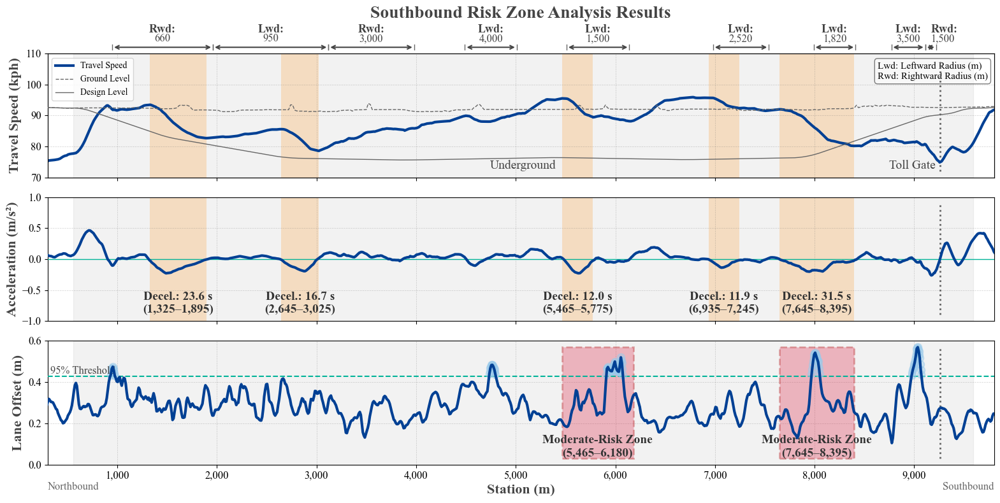

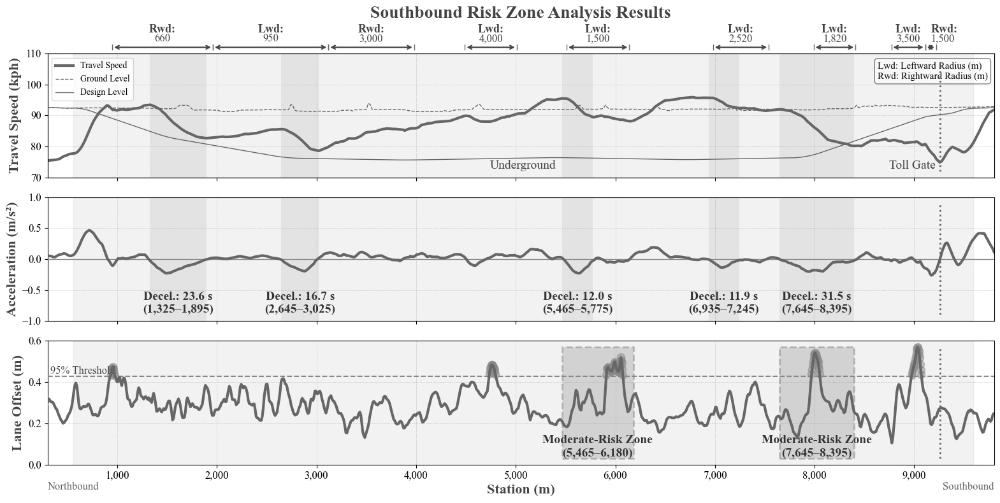

  - Southbound의 위험 구간 검토를 완료하였습니다. (2024-08-02 12:36:11)


In [11]:
# 03-2. Southbound 위험 구간 검토 (240801)
print("03-2. Southbound 위험 구간 검토")

# 감속 구간 및 도로편측 상위 95% 구간 계산 및 표시
def calculate_and_display_zones(df, png_file_name='sb_result_bw.png', graph_color='#666', hline_color='#888', marker_color='#888', decel_color='#aaa', risk_zone_color='#888', rz_line_color='#444', le_threshold_color='#444'):
    # 감속 구간 계산
    deceleration_threshold = 0  # 감속 임계값 (m/s²)
    df['deceleration'] = df['acceleration_m_per_s2_avg'].apply(lambda x: x if x < deceleration_threshold else 0)

    # 시간 계산
    df['time_diff'] = df['cumulative_time_min_avg'].diff().fillna(0) * 60  # 초 단위 시간 차이
    df['deceleration_duration_sec'] = df['time_diff'] * (df['deceleration'] != 0).astype(int)
    df['deceleration_duration_sec_cumsum'] = df.groupby((df['deceleration_duration_sec'] == 0).cumsum())['deceleration_duration_sec'].cumsum()

    long_deceleration_zones = df[df['deceleration_duration_sec_cumsum'] >= 10]  # 감속이 10초 이상 이어지는 구간

    # 도로편측 상위 95% 구간 계산
    lane_offset_threshold = df['lane_offset_m_avg'].quantile(0.95)
    high_lane_offset_zones = df[df['lane_offset_m_avg'] > lane_offset_threshold]  # 도로편측 상위 95% 구간

    # 감속 구간 시작 및 끝 표시
    deceleration_segments = []
    for key, group in df.groupby((df['deceleration_duration_sec_cumsum'] == 0).cumsum()):
        if len(group) > 1 and group['deceleration_duration_sec_cumsum'].max() >= 10:
            start = group['station'].iloc[0]
            end = group['station'].iloc[-1]
            duration = group['deceleration_duration_sec_cumsum'].max()
            deceleration_segments.append((start, end, duration))

    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 8))

    # Y축 범위 계산
    max_speed = math.ceil(df['travel_speed_kph_avg'].max() / 10) * 10 + 10  # 주행속도 최대값
    max_acceleration = 1  # 가속도 최대값
    min_acceleration = math.floor(df['acceleration_m_per_s2_avg'].min())  # 가속도 최소값

    # zorder
    z_underground_box = 1  # 언더그라운드 박스
    z_ground_level = 11  # 지반고
    z_design_level = 12  # 계획고
    z_decel_box = 16  # 감속 구간 박스
    z_risk_box = 17  # 위험 구간 박스
    z_toll_gate_vline = 21  # 톨게이트 세로선
    z_hline = 31  # 가로선
    z_marker = 41  # 마커
    z_text = 46  # 텍스트
    z_graph = 50  # 그래프

    # ==========
    # Travel Speed 시각화
    axes[0].set_title('Southbound Risk Zone Analysis Results', fontproperties=times_bold_font, fontsize=20, color='#444', pad=40)  # 타이틀
    axes[0].plot(df['station'], df['travel_speed_kph_avg'], label='Travel Speed', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[0].tick_params(labelbottom=False)  # X축 레이블 (제거)
    axes[0].set_ylabel('Travel Speed (kph)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[0].set_xlim(300, 9800)  # X축 범위 설정
    axes[0].set_ylim(70, max_speed)  # Y축 범위 설정
    axes[0].xaxis.set_major_locator(ticker.MultipleLocator(1000))  # X축 눈금 간격 설정
    axes[0].yaxis.set_major_locator(ticker.MultipleLocator(10))  # Y축 눈금 간격 설정
    axes[0].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[0].get_yticklabels():  # Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # Ground Level 및 Design Level 시각화
    axes2 = axes[0].twinx()  # 두 번째 Y축 생성
    axes2.plot(df['station'], df['ground_level'], label='Ground Level', color='#666', linestyle='--', linewidth=1, zorder=z_ground_level)  # 지반고
    axes2.plot(df['station'], df['design_level'], label='Design Level', color='#666', linestyle='-', linewidth=1, zorder=z_design_level)  # 계획고
    axes2.set_ylim(df['design_level'].min()-30, df['ground_level'].max()+80)  # Y축 범위 설정
    axes2.set_yticks([])  # Y축 눈금 제거
    axes2.set_ylabel('')  # Y축 레이블 제거

    # 범례 설정
    lines_1, labels_1 = axes[0].get_legend_handles_labels()
    lines_2, labels_2 = axes2.get_legend_handles_labels()
    axes[0].legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left', fontsize=12, prop=times_font)

    # 터널 구간(X=560~9590)에 사각형 및 레이블 추가
    rect = plt.Rectangle((560, axes[0].get_ylim()[0]), 9030, (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[0].add_patch(rect)
    axes[0].text(560+(9590-560)/2, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05, 'Underground', color='#444', fontsize=14, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)

    # Toll Gate 위치에 세로선 및 레이블 추가
    axes[0].axvline(x=9260, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)
    axes[0].text(9260-50, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05, 'Toll Gate', color='#444', fontsize=14, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='right', zorder=z_text)

    # X축 구간을 화살표로 표시
    segments = [(950, 1960), (1960, 3120), (3120, 3980), (4490, 5010), (5510, 6140), (6980, 7540), (7990, 8410), (8770, 9110), (9110, 9220)]
    messages = [
        ("Rwd:", "660", 'center'), ("Lwd:", "950", 'center'), ("Rwd:", "3,000", 'center'), ("Lwd:", "4,000", 'center'),
        ("Lwd:", "1,500", 'center'), ("Lwd:", "2,520", 'center'), ("Lwd:", "1,820", 'center'), ("Lwd:", "3,500", 'center'),
        ("Rwd:", "1,500", 'left')
    ]
    for (start, end), (first_line, second_line, align) in zip(segments, messages):
        axes[0].annotate('', xy=(end, 1.05), xytext=(start, 1.05),
                         xycoords=('data', 'axes fraction'), textcoords=('data', 'axes fraction'),
                         arrowprops=dict(arrowstyle='<->', color='#444', lw=1.5, clip_on=False))
        axes[0].plot([start, start], [1.03, 1.07], transform=axes[0].get_xaxis_transform(), color='#666', lw=1.0, clip_on=False)
        axes[0].plot([end, end], [1.03, 1.07], transform=axes[0].get_xaxis_transform(), color='#666', lw=1.0, clip_on=False)

        # 각 화살표 위에 첫 줄과 둘째 줄 메시지를 정렬하여 입력
        mid_point = (start + end) / 2
        axes[0].text(mid_point, 1.15, first_line, transform=axes[0].get_xaxis_transform(), color='#444', fontsize=13, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment=align, clip_on=False)
        axes[0].text(mid_point, 1.075, second_line, transform=axes[0].get_xaxis_transform(), color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment=align, clip_on=False)

    # 구간 설명 박스 추가
    props = dict(boxstyle='round', facecolor='#fff', alpha=0.5)
    textstr = 'Lwd: Leftward Radius (m)\nRwd: Rightward Radius (m)'
    axes[0].text(0.877, 0.936, textstr, transform=axes[0].transAxes, fontsize=11,
                 verticalalignment='top', bbox=props, fontproperties=times_font)

    # ==========
    # Acceleration 시각화
    axes[1].plot(df['station'], df['acceleration_agr_m_per_s2_avg'], label='Average Acceleration (m/s²)', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[1].tick_params(labelbottom=False)  # X축 레이블 (제거)
    axes[1].set_ylabel('Acceleration (m/s²)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[1].set_xlim(300, 9800)  # X축 범위 설정
    axes[1].set_ylim(min_acceleration, max_acceleration)  # Y축 범위 설정
    axes[1].xaxis.set_major_locator(ticker.MultipleLocator(1000))  # X축 눈금 간격 설정
    axes[1].yaxis.set_major_locator(ticker.MultipleLocator(0.5))  # Y축 눈금 간격 설정
    axes[1].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[1].get_yticklabels():  # Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # 터널 구간(X=560~9590)에 사각형 추가
    rect = plt.Rectangle((560, axes[1].get_ylim()[0]), 9030, (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[1].add_patch(rect)

    # Toll Gate 위치에 세로선 추가
    axes[1].axvline(x=9260, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)

    # Y=0 위치에 가로선 추가
    axes[1].axhline(y=0, color=hline_color, linestyle='-', linewidth=1, alpha=1.0, zorder=z_hline)

    # ==========
    # Lane Offset 시각화
    axes[2].plot(df['station'], df['lane_offset_m_avg'], label='Average Lane Offset (m)', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[2].set_xlabel('Station (m)', fontproperties=times_bold_font, fontsize=16, color='#444')  # X축 레이블
    axes[2].set_ylabel('Lane Offset (m)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[2].set_xlim(300, 9800)  # X축 범위 설정
    axes[2].set_ylim(0, 0.6)  # Y축 범위 설정
    axes[2].xaxis.set_major_locator(ticker.MultipleLocator(1000))  # X축 눈금 간격 설정
    axes[2].xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{int(x):,}'))  # X축 눈금 표시방법 설정
    axes[2].yaxis.set_major_locator(ticker.MultipleLocator(0.2))  # Y축 눈금 간격 설정
    axes[2].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[2].get_xticklabels() + axes[2].get_yticklabels():  # X축 및 Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # 터널 구간(X=560~9590)에 사각형 추가
    rect = plt.Rectangle((560, axes[2].get_ylim()[0]), 9030, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[2].add_patch(rect)

    # Toll Gate 위치에 세로선 추가
    axes[2].axvline(x=9260, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)

    # 위험 구간(X=5465~6180)에 사각형 추가
    rect = plt.Rectangle((5465, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05), 715, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[2].add_patch(rect)
    axes[2].text((5465+6180)/2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05, 'Moderate-Risk Zone\n(5,465–6,180)', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)
    # 위험 구간(X=7645~8395)에 사각형 추가
    rect = plt.Rectangle((7645, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05), 750, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[2].add_patch(rect)
    axes[2].text((7645+8395)/2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05, 'Moderate-Risk Zone\n(7,645–8,395)', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)

    # 상위 95% 지점에 가로선 추가
    lane_offset_95_percentile = df['lane_offset_m_avg'].quantile(0.95)
    axes[2].axhline(y=lane_offset_95_percentile, color=hline_color, linestyle='--', linewidth=1.5, label='95% Lane Offset Threshold', zorder=z_hline)
    axes[2].scatter(high_lane_offset_zones['station'], high_lane_offset_zones['lane_offset_m_avg'], color=marker_color, label='High Lane Offset Zone', marker='o', s=75, alpha=0.5, zorder=z_marker)
    axes[2].text(300+30, lane_offset_95_percentile, '95% Threshold', color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='left', zorder=z_text)

    # 감속 구간 음영 표시
    for start, end, duration in deceleration_segments:
        for ax in axes[:-1]:  # 마지막 그래프 제외
            rect = plt.Rectangle((start, ax.get_ylim()[0]), end - start, ax.get_ylim()[1] - ax.get_ylim()[0], color=decel_color, alpha=0.2, linewidth=0)
            ax.add_patch(rect)
        axes[1].text((start + end) / 2, axes[1].get_ylim()[0] + (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.05, f'Decel.: {duration:.1f} s\n({int(start):,}–{int(end):,})', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)

    # Southbound와 Northbound 텍스트 추가
    x_min, x_max = axes[2].get_xlim()  # X축의 최소값과 최대값 가져오기
    axes[2].text(x_max, axes[2].get_ylim()[0] - (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.14, 'Southbound', color='#666', fontsize=12, fontproperties=times_font, verticalalignment='top', horizontalalignment='right')
    axes[2].text(x_min, axes[2].get_ylim()[0] - (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.14, 'Northbound', color='#666', fontsize=12, fontproperties=times_font, verticalalignment='top', horizontalalignment='left')

    # 레이아웃 조정
    plt.tight_layout()
    plt.show()

    # 전체 그래프를 파일로 저장
    output_file_path = os.path.join(base_path, 'Output', png_file_name)
    fig.savefig(output_file_path, dpi=300, bbox_inches='tight')

# color
UOS_Signature_Blue = '#004094'
UOS_Blue_Soft = '#9bcbeb'
UOS_Emerald = '#00b398'

# Southbound 데이터를 이용한 위험 구간 검토
# 컬러 그래프
calculate_and_display_zones(
    southbound_df,
    png_file_name='sb_result_color.png',
    graph_color=UOS_Signature_Blue,
    hline_color=UOS_Emerald,
    marker_color=UOS_Blue_Soft,
    decel_color='#ff8800',
    risk_zone_color='#dd2244',
    rz_line_color='#aa0000',
    le_threshold_color='#aa0000'
)
# 흑백 그래프
calculate_and_display_zones(southbound_df)

print(f"  - Southbound의 위험 구간 검토를 완료하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# ==================================================

03-3. Southbound 데이터 시각화 (주행시간 기준)


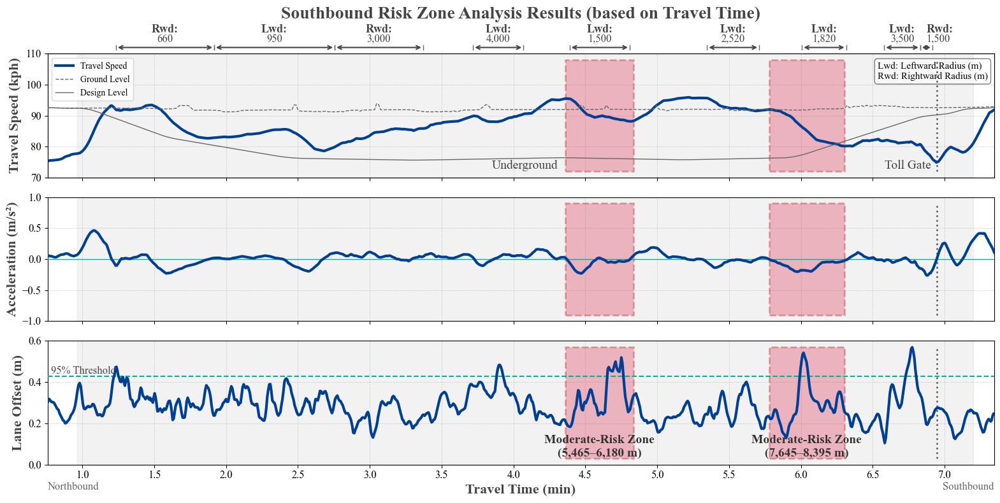

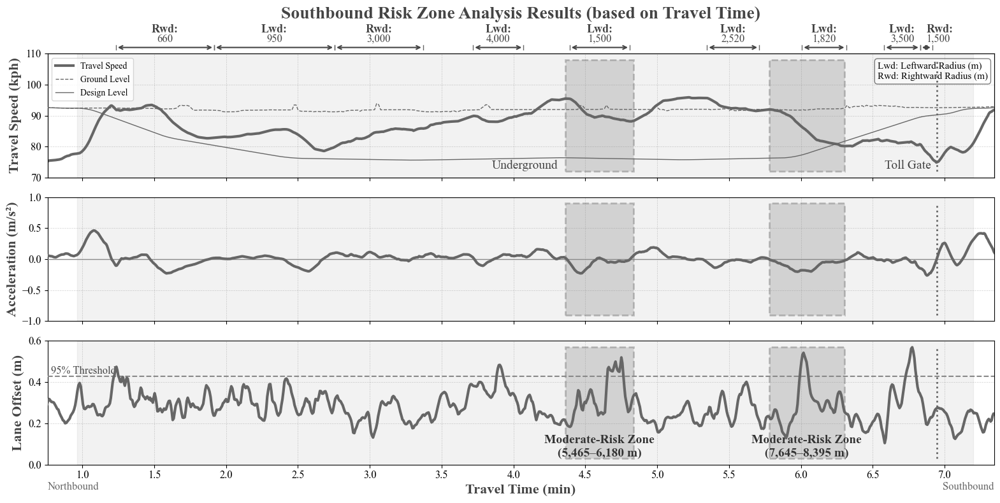

  - Southbound 데이터 시각화를 완료하였습니다. (2024-08-02 12:36:18)


In [12]:
# 03-3. Southbound 데이터 시각화 (주행시간 기준) (240801)
print("03-3. Southbound 데이터 시각화 (주행시간 기준)")

# Southbound 데이터 시각화 함수 정의
def visualize_data(df, png_file_name='sb_result_travel_time_bw.png', graph_color='#666', hline_color='#888', risk_zone_color='#888', rz_line_color='#444', le_threshold_color='#444'):
    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 8))

    # Y축 범위 계산
    max_speed = math.ceil(df['travel_speed_kph_avg'].max() / 10) * 10 + 10  # 주행속도 최대값
    max_acceleration = 1  # 가속도 최대값
    min_acceleration = math.floor(df['acceleration_m_per_s2_avg'].min())  # 가속도 최소값

    # zorder
    z_underground_box = 1  # 언더그라운드 박스
    z_ground_level = 11  # 지반고
    z_design_level = 12  # 계획고
    z_decel_box = 16  # 감속 구간 박스
    z_risk_box = 17  # 위험 구간 박스
    z_toll_gate_vline = 21  # 톨게이트 세로선
    z_hline = 31  # 가로선
    z_marker = 41  # 마커
    z_text = 46  # 텍스트
    z_graph = 50  # 그래프

    # ==========
    # Travel Speed 시각화
    start_graph_time = df[df['station'] == 300]['cumulative_time_min_avg'].values[0]
    end_graph_time = df[df['station'] == 9800]['cumulative_time_min_avg'].values[0]
    axes[0].set_title('Southbound Risk Zone Analysis Results (based on Travel Time)', fontproperties=times_bold_font, fontsize=20, color='#444', pad=40)  # 타이틀
    axes[0].plot(df['cumulative_time_min_avg'], df['travel_speed_kph_avg'], label='Travel Speed', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[0].tick_params(labelbottom=False)  # X축 레이블 (제거)
    axes[0].set_ylabel('Travel Speed (kph)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[0].set_xlim(start_graph_time, end_graph_time)  # X축 범위 설정
    axes[0].set_ylim(70, max_speed)  # Y축 범위 설정
    axes[0].xaxis.set_major_locator(ticker.MultipleLocator(0.5))  # X축 눈금 간격 설정
    axes[0].yaxis.set_major_locator(ticker.MultipleLocator(10))  # Y축 눈금 간격 설정
    axes[0].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[0].get_yticklabels():  # Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # Ground Level 및 Design Level 시각화
    axes2 = axes[0].twinx()  # 두 번째 Y축 생성
    axes2.plot(df['cumulative_time_min_avg'], df['ground_level'], label='Ground Level', color='#666', linestyle='--', linewidth=1, zorder=z_ground_level)  # 지반고
    axes2.plot(df['cumulative_time_min_avg'], df['design_level'], label='Design Level', color='#666', linestyle='-', linewidth=1, zorder=z_design_level)  # 계획고
    axes2.set_ylim(df['design_level'].min()-30, df['ground_level'].max()+80)  # Y축 범위 설정
    axes2.set_yticks([])  # Y축 눈금 제거
    axes2.set_ylabel('')  # Y축 레이블 제거

    # 범례 설정
    lines_1, labels_1 = axes[0].get_legend_handles_labels()
    lines_2, labels_2 = axes2.get_legend_handles_labels()
    axes[0].legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left', fontsize=12, prop=times_font)

    # 터널 구간(X=560~9590)에 사각형 및 레이블 추가
    start_tunnel_time = df[df['station'] == 560]['cumulative_time_min_avg'].values[0]
    end_tunnel_time = df[df['station'] == 9590]['cumulative_time_min_avg'].values[0]
    rect = plt.Rectangle((start_tunnel_time, axes[0].get_ylim()[0]), end_tunnel_time - start_tunnel_time, (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[0].add_patch(rect)
    axes[0].text((start_tunnel_time + end_tunnel_time) / 2, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05, 'Underground', color='#444', fontsize=14, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)

    # Toll Gate 위치에 세로선 및 레이블 추가
    toll_gate_time = df[df['station'] == 9260]['cumulative_time_min_avg'].values[0]
    toll_gate_label_time = df[df['station'] == (9260-50)]['cumulative_time_min_avg'].values[0]
    axes[0].axvline(x=toll_gate_time, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)
    axes[0].text(toll_gate_label_time, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05, 'Toll Gate', color='#444', fontsize=14, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='right', zorder=z_text)

    # 위험 구간(X=5465~6180)에 사각형 추가
    start_risk_zone_time_1 = df[df['station'] == 5465]['cumulative_time_min_avg'].values[0]
    end_risk_zone_time_1 = df[df['station'] == 6180]['cumulative_time_min_avg'].values[0]
    rect = plt.Rectangle((start_risk_zone_time_1, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05), end_risk_zone_time_1 - start_risk_zone_time_1, (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[0].add_patch(rect)

    # 위험 구간(X=7645~8395)에 사각형 추가
    start_risk_zone_time_2 = df[df['station'] == 7645]['cumulative_time_min_avg'].values[0]
    end_risk_zone_time_2 = df[df['station'] == 8395]['cumulative_time_min_avg'].values[0]
    rect = plt.Rectangle((start_risk_zone_time_2, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05), end_risk_zone_time_2 - start_risk_zone_time_2, (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[0].add_patch(rect)

    # X축 구간을 화살표로 표시
    segments = [(950, 1960), (1960, 3120), (3120, 3980), (4490, 5010), (5510, 6140), (6980, 7540), (7990, 8410), (8770, 9110), (9110, 9220)]
    messages = [
        ("Rwd:", "660", 'center'), ("Lwd:", "950", 'center'), ("Rwd:", "3,000", 'center'), ("Lwd:", "4,000", 'center'),
        ("Lwd:", "1,500", 'center'), ("Lwd:", "2,520", 'center'), ("Lwd:", "1,820", 'center'), ("Lwd:", "3,500", 'center'),
        ("Rwd:", "1,500", 'left')
    ]
    for (start, end), (first_line, second_line, align) in zip(segments, messages):
        start_time = df[df['station'] == start]['cumulative_time_min_avg'].values[0]
        end_time = df[df['station'] == end]['cumulative_time_min_avg'].values[0]
        axes[0].annotate('', xy=(end_time, 1.05), xytext=(start_time, 1.05),
                         xycoords=('data', 'axes fraction'), textcoords=('data', 'axes fraction'),
                         arrowprops=dict(arrowstyle='<->', color='#444', lw=1.5, clip_on=False))
        axes[0].plot([start_time, start_time], [1.03, 1.07], transform=axes[0].get_xaxis_transform(), color='#666', lw=1.0, clip_on=False)
        axes[0].plot([end_time, end_time], [1.03, 1.07], transform=axes[0].get_xaxis_transform(), color='#666', lw=1.0, clip_on=False)

        # 각 화살표 위에 첫 줄과 둘째 줄 메시지를 정렬하여 입력
        mid_point = (start_time + end_time) / 2
        axes[0].text(mid_point, 1.15, first_line, transform=axes[0].get_xaxis_transform(), color='#444', fontsize=13, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment=align, clip_on=False)
        axes[0].text(mid_point, 1.075, second_line, transform=axes[0].get_xaxis_transform(), color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment=align, clip_on=False)

    # 구간 설명 박스 추가
    props = dict(boxstyle='round', facecolor='#fff', alpha=0.5)
    textstr = 'Lwd: Leftward Radius (m)\nRwd: Rightward Radius (m)'
    axes[0].text(0.877, 0.936, textstr, transform=axes[0].transAxes, fontsize=11,
                 verticalalignment='top', bbox=props, fontproperties=times_font)

    # ==========
    # Acceleration 시각화
    axes[1].plot(df['cumulative_time_min_avg'], df['acceleration_agr_m_per_s2_avg'], label='Average Acceleration (m/s²)', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[1].tick_params(labelbottom=False)  # X축 레이블 (제거)
    axes[1].set_ylabel('Acceleration (m/s²)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[1].set_xlim(start_graph_time, end_graph_time)  # X축 범위 설정
    axes[1].set_ylim(min_acceleration, max_acceleration)  # Y축 범위 설정
    axes[1].xaxis.set_major_locator(ticker.MultipleLocator(0.5))  # X축 눈금 간격 설정
    axes[1].yaxis.set_major_locator(ticker.MultipleLocator(0.5))  # Y축 눈금 간격 설정
    axes[1].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[1].get_yticklabels():  # Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # 터널 구간(X=560~9590)에 사각형 추가
    rect = plt.Rectangle((start_tunnel_time, axes[1].get_ylim()[0]), end_tunnel_time - start_tunnel_time, (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[1].add_patch(rect)

    # Toll Gate 위치에 세로선 추가
    axes[1].axvline(x=toll_gate_time, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)

    # Y=0 위치에 가로선 추가
    axes[1].axhline(y=0, color=hline_color, linestyle='-', linewidth=1, alpha=1.0, zorder=z_hline)

    # 위험 구간(X=5465~6180)에 사각형 추가
    rect = plt.Rectangle((start_risk_zone_time_1, axes[1].get_ylim()[0] + (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.05), end_risk_zone_time_1 - start_risk_zone_time_1, (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[1].add_patch(rect)
    # 위험 구간(X=7645~8395)에 사각형 추가
    rect = plt.Rectangle((start_risk_zone_time_2, axes[1].get_ylim()[0] + (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.05), end_risk_zone_time_2 - start_risk_zone_time_2, (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[1].add_patch(rect)

    # ==========
    # Lane Offset 시각화
    axes[2].plot(df['cumulative_time_min_avg'], df['lane_offset_m_avg'], label='Average Lane Offset (m)', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[2].set_xlabel('Travel Time (min)', fontproperties=times_bold_font, fontsize=16, color='#444')  # X축 레이블
    axes[2].set_ylabel('Lane Offset (m)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[2].set_xlim(start_graph_time, end_graph_time)  # X축 범위 설정
    axes[2].set_ylim(0, 0.6)  # Y축 범위 설정
    axes[2].xaxis.set_major_locator(ticker.MultipleLocator(0.5))  # X축 눈금 간격 설정
    axes[2].yaxis.set_major_locator(ticker.MultipleLocator(0.2))  # Y축 눈금 간격 설정
    axes[2].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[2].get_xticklabels() + axes[2].get_yticklabels():  # X축 및 Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # 터널 구간(X=560~9590)에 사각형 추가
    rect = plt.Rectangle((start_tunnel_time, axes[2].get_ylim()[0]), end_tunnel_time - start_tunnel_time, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[2].add_patch(rect)

    # Toll Gate 위치에 세로선 추가
    axes[2].axvline(x=toll_gate_time, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)

    # 위험 구간(X=5465~6180)에 사각형 추가
    rect = plt.Rectangle((start_risk_zone_time_1, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05), end_risk_zone_time_1 - start_risk_zone_time_1, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[2].add_patch(rect)
    axes[2].text((start_risk_zone_time_1 + end_risk_zone_time_1) / 2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05, 'Moderate-Risk Zone\n(5,465–6,180 m)', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)
    # 위험 구간(X=7645~8395)에 사각형 추가
    rect = plt.Rectangle((start_risk_zone_time_2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05), end_risk_zone_time_2 - start_risk_zone_time_2, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[2].add_patch(rect)
    axes[2].text((start_risk_zone_time_2 + end_risk_zone_time_2) / 2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05, 'Moderate-Risk Zone\n(7,645–8,395 m)', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)

    # 상위 95% 지점에 가로선 추가
    lane_offset_95_percentile_text = df[df['station'] == (300+30)]['cumulative_time_min_avg'].values[0]
    lane_offset_95_percentile = df['lane_offset_m_avg'].quantile(0.95)
    axes[2].axhline(y=lane_offset_95_percentile, color=hline_color, linestyle='--', linewidth=1.5, label='95% Lane Offset Threshold', zorder=z_hline)
    axes[2].text(lane_offset_95_percentile_text, lane_offset_95_percentile, '95% Threshold', color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='left', zorder=z_text)

    # Southbound와 Northbound 텍스트 추가
    x_min, x_max = axes[2].get_xlim()  # X축의 최소값과 최대값 가져오기
    axes[2].text(x_max, axes[2].get_ylim()[0] - (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.14, 'Southbound', color='#666', fontsize=12, fontproperties=times_font, verticalalignment='top', horizontalalignment='right')
    axes[2].text(x_min, axes[2].get_ylim()[0] - (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.14, 'Northbound', color='#666', fontsize=12, fontproperties=times_font, verticalalignment='top', horizontalalignment='left')

    # 레이아웃 조정
    plt.tight_layout()
    plt.show()

    # 전체 그래프를 파일로 저장
    output_file_path = os.path.join(base_path, 'Output', png_file_name)
    fig.savefig(output_file_path, dpi=300, bbox_inches='tight')

# color
UOS_Signature_Blue = '#004094'
UOS_Blue_Soft = '#9bcbeb'
UOS_Emerald = '#00b398'

# Southbound 데이터를 이용한 위험 구간 검토
# 컬러 그래프
visualize_data(
    southbound_df,
    png_file_name='sb_result_travel_time_color.png',
    graph_color=UOS_Signature_Blue,
    hline_color=UOS_Emerald,
    risk_zone_color='#dd2244',
    rz_line_color='#aa0000',
    le_threshold_color='#aa0000'
)
# 흑백 그래프
visualize_data(southbound_df)

print(f"  - Southbound 데이터 시각화를 완료하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# ==================================================

## 03-3. 성산 방면

03-4. Northbound 위험 구간 검토


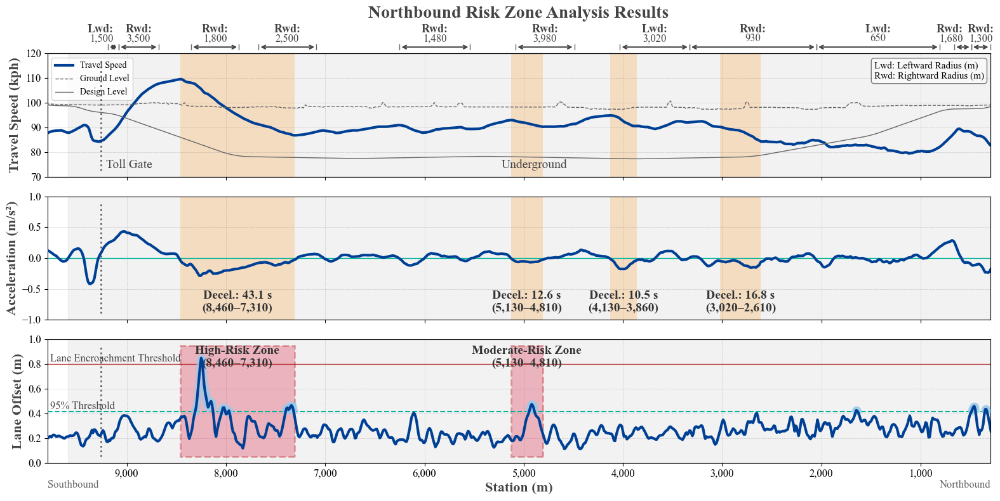

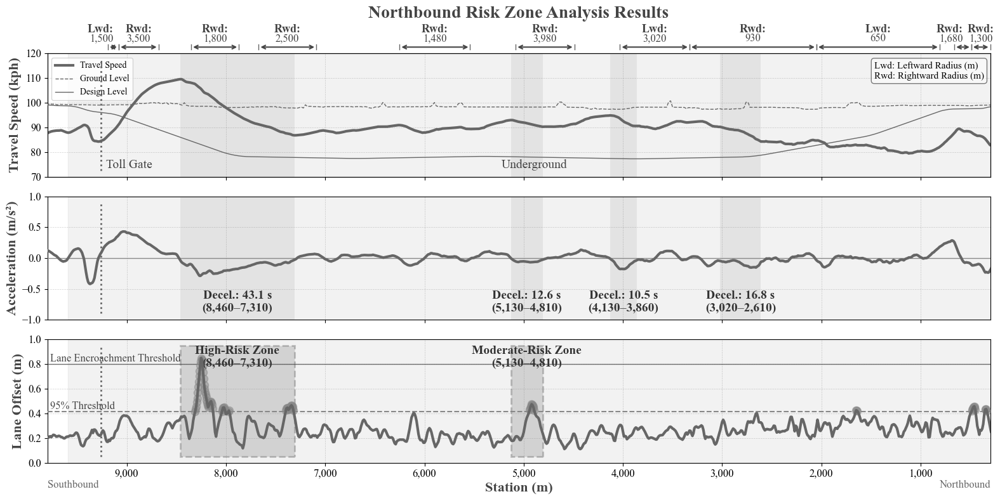

  - Northbound의 위험 구간 검토를 완료하였습니다. (2024-08-02 12:36:25)


In [13]:
# 03-4. Northbound 위험 구간 검토 (240801)
print("03-4. Northbound 위험 구간 검토")

# 감속 구간 및 도로편측 상위 95% 구간 계산 및 표시
def calculate_and_display_zones(df, png_file_name='nb_result_bw.png', graph_color='#666', hline_color='#888', marker_color='#888', decel_color='#aaa', risk_zone_color='#888', rz_line_color='#444', le_threshold_color='#444'):
    # 감속 구간 계산
    deceleration_threshold = 0  # 감속 임계값 (m/s²)
    df['deceleration'] = df['acceleration_m_per_s2_avg'].apply(lambda x: x if x < deceleration_threshold else 0)

    # 시간 계산
    df['time_diff'] = df['cumulative_time_min_avg'].diff().fillna(0) * 60  # 초 단위 시간 차이
    df['deceleration_duration_sec'] = df['time_diff'] * (df['deceleration'] != 0).astype(int)
    df['deceleration_duration_sec_cumsum'] = df.groupby((df['deceleration_duration_sec'] == 0).cumsum())['deceleration_duration_sec'].cumsum()

    long_deceleration_zones = df[df['deceleration_duration_sec_cumsum'] >= 10]  # 감속이 10초 이상 이어지는 구간

    # 도로편측 상위 95% 구간 계산
    lane_offset_threshold = df['lane_offset_m_avg'].quantile(0.95)
    high_lane_offset_zones = df[df['lane_offset_m_avg'] > lane_offset_threshold]  # 도로편측 상위 95% 구간

    # 감속 구간 시작 및 끝 표시
    deceleration_segments = []
    for key, group in df.groupby((df['deceleration_duration_sec_cumsum'] == 0).cumsum()):
        if len(group) > 1 and group['deceleration_duration_sec_cumsum'].max() >= 10:
            start = group['station'].iloc[0]
            end = group['station'].iloc[-1]
            duration = group['deceleration_duration_sec_cumsum'].max()
            deceleration_segments.append((start, end, duration))

    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 8))

    # Y축 범위 계산
    max_speed = math.ceil(df['travel_speed_kph_avg'].max() / 10) * 10 + 10  # 주행속도 최대값
    max_acceleration = 1  # 가속도 최대값
    min_acceleration = math.floor(df['acceleration_m_per_s2_avg'].min())  # 가속도 최소값

    # zorder
    z_underground_box = 1  # 언더그라운드 박스
    z_ground_level = 11  # 지반고
    z_design_level = 12  # 계획고
    z_decel_box = 16  # 감속 구간 박스
    z_risk_box = 17  # 위험 구간 박스
    z_toll_gate_vline = 21  # 톨게이트 세로선
    z_hline = 31  # 가로선
    z_marker = 41  # 마커
    z_text = 46  # 텍스트
    z_graph = 50  # 그래프

    # ==========
    # Travel Speed 시각화
    axes[0].set_title('Northbound Risk Zone Analysis Results', fontproperties=times_bold_font, fontsize=20, color='#444', pad=40)  # 타이틀
    axes[0].plot(df['station'], df['travel_speed_kph_avg'], label='Travel Speed', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[0].tick_params(labelbottom=False)  # X축 레이블 (제거)
    axes[0].set_ylabel('Travel Speed (kph)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[0].set_xlim(9800, 300)  # X축 범위 설정
    axes[0].set_ylim(70, max_speed)  # Y축 범위 설정
    axes[0].xaxis.set_major_locator(ticker.MultipleLocator(1000))  # X축 눈금 간격 설정
    axes[0].yaxis.set_major_locator(ticker.MultipleLocator(10))  # Y축 눈금 간격 설정
    axes[0].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[0].get_yticklabels():  # Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # Ground Level 및 Design Level 시각화
    axes2 = axes[0].twinx()  # 두 번째 Y축 생성
    axes2.plot(df['station'], df['ground_level'], label='Ground Level', color='#666', linestyle='--', linewidth=1, zorder=z_ground_level)  # 지반고
    axes2.plot(df['station'], df['design_level'], label='Design Level', color='#666', linestyle='-', linewidth=1, zorder=z_design_level)  # 계획고
    axes2.set_ylim(df['design_level'].min()-30, df['ground_level'].max()+80)  # Y축 범위 설정
    axes2.set_yticks([])  # Y축 눈금 제거
    axes2.set_ylabel('')  # Y축 레이블 제거

    # 범례 설정
    lines_1, labels_1 = axes[0].get_legend_handles_labels()
    lines_2, labels_2 = axes2.get_legend_handles_labels()
    axes[0].legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left', fontsize=12, prop=times_font)

    # 터널 구간(X=9590~190)에 사각형 및 레이블 추가
    rect = plt.Rectangle((190, axes[0].get_ylim()[0]), 9400, (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[0].add_patch(rect)
    axes[0].text(190+(9590-190)/2, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05, 'Underground', color='#444', fontsize=14, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)

    # Toll Gate 위치에 세로선 및 레이블 추가
    axes[0].axvline(x=9260, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)
    axes[0].text(9260-50, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05, 'Toll Gate', color='#444', fontsize=14, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='left', zorder=z_text)

    # X축 구간을 화살표로 표시
    segments = [(300, 490), (490, 660), (810, 2050), (2050, 3330), (3330, 4030), (4490, 5080), (5540, 6250), (7090, 7670), (7870, 8350), (8680, 9080), (9080, 9190)]
    messages = [
        ("Rwd:", "1,300", 'center'), ("Rwd:", "1,680", 'right'), ("Lwd:", "650", 'center'), ("Rwd:", "930", 'center'),
        ("Lwd:", "3,020", 'center'), ("Rwd:", "3,980", 'center'), ("Rwd:", "1,480", 'center'), ("Rwd:", "2,500", 'center'),
        ("Rwd:", "1,800", 'center'), ("Rwd:", "3,500", 'center'), ("Lwd:", "1,500", 'right')
    ]
    for (start, end), (first_line, second_line, align) in zip(segments, messages):
        axes[0].annotate('', xy=(end, 1.05), xytext=(start, 1.05),
                         xycoords=('data', 'axes fraction'), textcoords=('data', 'axes fraction'),
                         arrowprops=dict(arrowstyle='<->', color='#444', lw=1.5, clip_on=False))
        axes[0].plot([start, start], [1.03, 1.07], transform=axes[0].get_xaxis_transform(), color='#666', lw=1.0, clip_on=False)
        axes[0].plot([end, end], [1.03, 1.07], transform=axes[0].get_xaxis_transform(), color='#666', lw=1.0, clip_on=False)

        # 각 화살표 위에 첫 줄과 둘째 줄 메시지를 정렬하여 입력
        mid_point = (start + end) / 2
        axes[0].text(mid_point, 1.15, first_line, transform=axes[0].get_xaxis_transform(), color='#444', fontsize=13, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment=align, clip_on=False)
        axes[0].text(mid_point, 1.075, second_line, transform=axes[0].get_xaxis_transform(), color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment=align, clip_on=False)

    # 구간 설명 박스 추가
    props = dict(boxstyle='round', facecolor='#fff', alpha=0.5)
    textstr = 'Lwd: Leftward Radius (m)\nRwd: Rightward Radius (m)'
    axes[0].text(0.877, 0.936, textstr, transform=axes[0].transAxes, fontsize=11,
                 verticalalignment='top', bbox=props, fontproperties=times_font)

    # ==========
    # Acceleration 시각화
    axes[1].plot(df['station'], df['acceleration_agr_m_per_s2_avg'], label='Average Acceleration (m/s²)', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[1].tick_params(labelbottom=False)  # X축 레이블 (제거)
    axes[1].set_ylabel('Acceleration (m/s²)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[1].set_xlim(9800, 300)  # X축 범위 설정
    axes[1].set_ylim(min_acceleration, max_acceleration)  # Y축 범위 설정
    axes[1].xaxis.set_major_locator(ticker.MultipleLocator(1000))  # X축 눈금 간격 설정
    axes[1].yaxis.set_major_locator(ticker.MultipleLocator(0.5))  # Y축 눈금 간격 설정
    axes[1].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[1].get_yticklabels():  # Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # 터널 구간(X=9590~190)에 사각형 추가
    rect = plt.Rectangle((190, axes[1].get_ylim()[0]), 9400, (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[1].add_patch(rect)

    # Toll Gate 위치에 세로선 추가
    axes[1].axvline(x=9260, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)

    # Y=0 위치에 가로선 추가
    axes[1].axhline(y=0, color=hline_color, linestyle='-', linewidth=1, alpha=1.0, zorder=z_hline)

    # ==========
    # Lane Offset 시각화
    axes[2].plot(df['station'], df['lane_offset_m_avg'], label='Average Lane Offset (m)', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[2].set_xlabel('Station (m)', fontproperties=times_bold_font, fontsize=16, color='#444')  # X축 레이블
    axes[2].set_ylabel('Lane Offset (m)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[2].set_xlim(9800, 300)  # X축 범위 설정
    axes[2].set_ylim(0, 1)  # Y축 범위 설정
    axes[2].xaxis.set_major_locator(ticker.MultipleLocator(1000))  # X축 눈금 간격 설정
    axes[2].xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{int(x):,}'))  # X축 눈금 표시방법 설정
    axes[2].yaxis.set_major_locator(ticker.MultipleLocator(0.2))  # Y축 눈금 간격 설정
    axes[2].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[2].get_xticklabels() + axes[2].get_yticklabels():  # X축 및 Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # 터널 구간(X=9590~190)에 사각형 추가
    rect = plt.Rectangle((190, axes[2].get_ylim()[0]), 9400, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[2].add_patch(rect)

    # Toll Gate 위치에 세로선 추가
    axes[2].axvline(x=9260, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)

    # 위험 구간(X=8460~7310)에 사각형 추가
    rect = plt.Rectangle((7310, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05), 1150, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[2].add_patch(rect)
    axes[2].text((8460+7310)/2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.95, 'High-Risk Zone\n(8,460–7,310)', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='top', horizontalalignment='center', zorder=z_text)
    # 위험 구간(X=5130~4810)에 사각형 추가
    rect = plt.Rectangle((4810, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05), 320, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[2].add_patch(rect)
    axes[2].text((5130+4810)/2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.95, 'Moderate-Risk Zone\n(5,130–4,810)', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='top', horizontalalignment='center', zorder=z_text)

    # 상위 95% 지점에 가로선 추가
    lane_offset_95_percentile = df['lane_offset_m_avg'].quantile(0.95)
    axes[2].axhline(y=lane_offset_95_percentile, color=hline_color, linestyle='--', linewidth=1.5, label='95% Lane Offset Threshold', zorder=z_hline)
    axes[2].scatter(high_lane_offset_zones['station'], high_lane_offset_zones['lane_offset_m_avg'], color=marker_color, label='High Lane Offset Zone', marker='o', s=75, alpha=0.5, zorder=z_marker)
    axes[2].text(9800-30, lane_offset_95_percentile, '95% Threshold', color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='left', zorder=z_text)

    # Y=0.8 위치에 가로선 추가
    axes[2].axhline(y=0.8, color=le_threshold_color, linestyle='-', linewidth=1, alpha=0.75, zorder=z_hline)
    axes[2].text(9800-30, 0.8, 'Lane Encroachment Threshold', color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='left', zorder=z_text)

    # 감속 구간 음영 표시
    for start, end, duration in deceleration_segments:
        for ax in axes[:-1]:  # 마지막 그래프 제외
            rect = plt.Rectangle((start, ax.get_ylim()[0]), end - start, ax.get_ylim()[1] - ax.get_ylim()[0], color=decel_color, alpha=0.2, linewidth=0)
            ax.add_patch(rect)
        axes[1].text((start + end) / 2, axes[1].get_ylim()[0] + (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.05, f'Decel.: {duration:.1f} s\n({int(start):,}–{int(end):,})', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)

    # Southbound와 Northbound 텍스트 추가
    x_min, x_max = axes[2].get_xlim()  # X축의 최소값과 최대값 가져오기
    axes[2].text(x_max, axes[2].get_ylim()[0] - (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.14, 'Northbound', color='#666', fontsize=12, fontproperties=times_font, verticalalignment='top', horizontalalignment='right')
    axes[2].text(x_min, axes[2].get_ylim()[0] - (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.14, 'Southbound', color='#666', fontsize=12, fontproperties=times_font, verticalalignment='top', horizontalalignment='left')

    # 레이아웃 조정
    plt.tight_layout()
    plt.show()

    # 전체 그래프를 파일로 저장
    output_file_path = os.path.join(base_path, 'Output', png_file_name)
    fig.savefig(output_file_path, dpi=300, bbox_inches='tight')

# color
UOS_Signature_Blue = '#004094'
UOS_Blue_Soft = '#9bcbeb'
UOS_Emerald = '#00b398'

# Northbound 데이터를 이용한 위험 구간 검토
# 컬러 그래프
calculate_and_display_zones(
    northbound_df,
    png_file_name='nb_result_color.png',
    graph_color=UOS_Signature_Blue,
    hline_color=UOS_Emerald,
    marker_color=UOS_Blue_Soft,
    decel_color='#ff8800',
    risk_zone_color='#dd2244',
    rz_line_color='#aa0000',
    le_threshold_color='#aa0000'
)
# 흑백 그래프
calculate_and_display_zones(northbound_df)

print(f"  - Northbound의 위험 구간 검토를 완료하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# ==================================================

03-5. Northbound 데이터 시각화 (주행시간 기준)


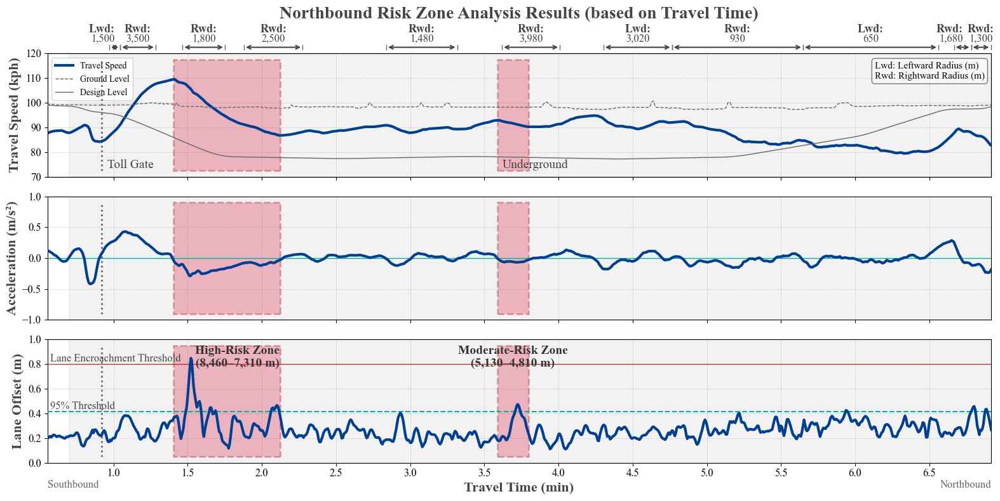

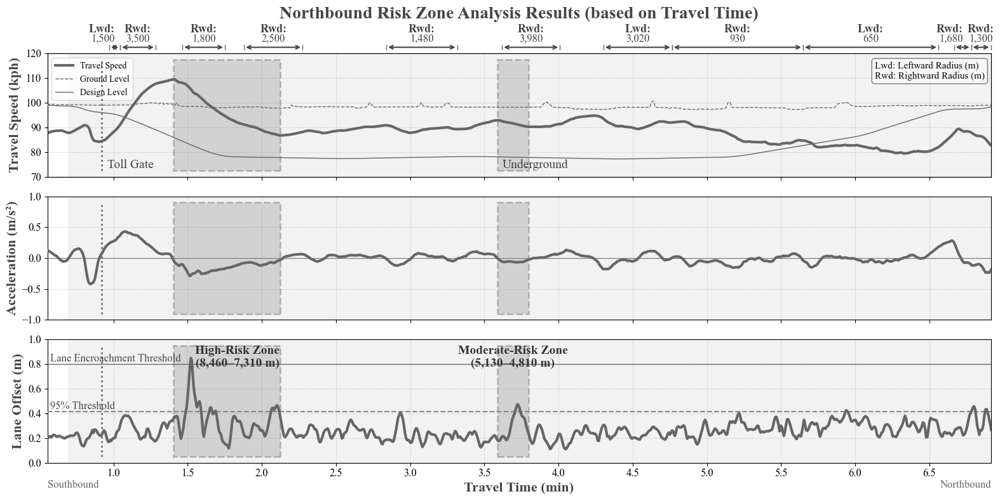

  - Northbound 데이터 시각화를 완료하였습니다. (2024-08-02 12:36:37)


In [14]:
# 03-5. Northbound 데이터 시각화 (주행시간 기준) (240801)
print("03-5. Northbound 데이터 시각화 (주행시간 기준)")

# Northbound 데이터 시각화 함수 정의
def visualize_data(df, png_file_name='nb_result_travel_time_bw.png', graph_color='#666', hline_color='#888', risk_zone_color='#888', rz_line_color='#444', le_threshold_color='#444'):
    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 8))

    # Y축 범위 계산
    max_speed = math.ceil(df['travel_speed_kph_avg'].max() / 10) * 10 + 10  # 주행속도 최대값
    max_acceleration = 1  # 가속도 최대값
    min_acceleration = math.floor(df['acceleration_m_per_s2_avg'].min())  # 가속도 최소값

    # zorder
    z_underground_box = 1  # 언더그라운드 박스
    z_ground_level = 11  # 지반고
    z_design_level = 12  # 계획고
    z_decel_box = 16  # 감속 구간 박스
    z_risk_box = 17  # 위험 구간 박스
    z_toll_gate_vline = 21  # 톨게이트 세로선
    z_hline = 31  # 가로선
    z_marker = 41  # 마커
    z_text = 46  # 텍스트
    z_graph = 50  # 그래프

    # ==========
    # Travel Speed 시각화
    start_graph_time = df[df['station'] == 9800]['cumulative_time_min_avg'].values[0]
    end_graph_time = df[df['station'] == 300]['cumulative_time_min_avg'].values[0]
    axes[0].set_title('Northbound Risk Zone Analysis Results (based on Travel Time)', fontproperties=times_bold_font, fontsize=20, color='#444', pad=40)  # 타이틀
    axes[0].plot(df['cumulative_time_min_avg'], df['travel_speed_kph_avg'], label='Travel Speed', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[0].tick_params(labelbottom=False)  # X축 레이블 (제거)
    axes[0].set_ylabel('Travel Speed (kph)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[0].set_xlim(start_graph_time, end_graph_time)  # X축 범위 설정
    axes[0].set_ylim(70, max_speed)  # Y축 범위 설정
    axes[0].xaxis.set_major_locator(ticker.MultipleLocator(0.5))  # X축 눈금 간격 설정
    axes[0].yaxis.set_major_locator(ticker.MultipleLocator(10))  # Y축 눈금 간격 설정
    axes[0].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[0].get_yticklabels():  # Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # Ground Level 및 Design Level 시각화
    axes2 = axes[0].twinx()  # 두 번째 Y축 생성
    axes2.plot(df['cumulative_time_min_avg'], df['ground_level'], label='Ground Level', color='#666', linestyle='--', linewidth=1, zorder=z_ground_level)  # 지반고
    axes2.plot(df['cumulative_time_min_avg'], df['design_level'], label='Design Level', color='#666', linestyle='-', linewidth=1, zorder=z_design_level)  # 계획고
    axes2.set_ylim(df['design_level'].min()-30, df['ground_level'].max()+80)  # Y축 범위 설정
    axes2.set_yticks([])  # Y축 눈금 제거
    axes2.set_ylabel('')  # Y축 레이블 제거

    # 범례 설정
    lines_1, labels_1 = axes[0].get_legend_handles_labels()
    lines_2, labels_2 = axes2.get_legend_handles_labels()
    axes[0].legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left', fontsize=12, prop=times_font)

    # 터널 구간(X=9590~190)에 사각형 및 레이블 추가
    start_tunnel_time = df[df['station'] == 190]['cumulative_time_min_avg'].values[0]
    end_tunnel_time = df[df['station'] == 9590]['cumulative_time_min_avg'].values[0]
    rect = plt.Rectangle((start_tunnel_time, axes[0].get_ylim()[0]), end_tunnel_time - start_tunnel_time, (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[0].add_patch(rect)
    axes[0].text((start_tunnel_time + end_tunnel_time) / 2, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05, 'Underground', color='#444', fontsize=14, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)

    # Toll Gate 위치에 세로선 및 레이블 추가
    toll_gate_time = df[df['station'] == 9260]['cumulative_time_min_avg'].values[0]
    toll_gate_label_time = df[df['station'] == (9260-50)]['cumulative_time_min_avg'].values[0]
    axes[0].axvline(x=toll_gate_time, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)
    axes[0].text(toll_gate_label_time, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05, 'Toll Gate', color='#444', fontsize=14, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='left', zorder=z_text)

    # 위험 구간(X=8460~7310)에 사각형 추가
    start_risk_zone_time_1 = df[df['station'] == 7310]['cumulative_time_min_avg'].values[0]
    end_risk_zone_time_1 = df[df['station'] == 8460]['cumulative_time_min_avg'].values[0]
    rect = plt.Rectangle((start_risk_zone_time_1, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05), end_risk_zone_time_1 - start_risk_zone_time_1, (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[0].add_patch(rect)

    # 위험 구간(X=5130~4810)에 사각형 추가
    start_risk_zone_time_2 = df[df['station'] == 5130]['cumulative_time_min_avg'].values[0]
    end_risk_zone_time_2 = df[df['station'] == 4810]['cumulative_time_min_avg'].values[0]
    rect = plt.Rectangle((start_risk_zone_time_2, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05), end_risk_zone_time_2 - start_risk_zone_time_2, (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[0].add_patch(rect)

    # X축 구간을 화살표로 표시
    segments = [(300, 490), (490, 660), (810, 2050), (2050, 3330), (3330, 4030), (4490, 5080), (5540, 6250), (7090, 7670), (7870, 8350), (8680, 9080), (9080, 9190)]
    messages = [
        ("Rwd:", "1,300", 'center'), ("Rwd:", "1,680", 'right'), ("Lwd:", "650", 'center'), ("Rwd:", "930", 'center'),
        ("Lwd:", "3,020", 'center'), ("Rwd:", "3,980", 'center'), ("Rwd:", "1,480", 'center'), ("Rwd:", "2,500", 'center'),
        ("Rwd:", "1,800", 'center'), ("Rwd:", "3,500", 'center'), ("Lwd:", "1,500", 'right')
    ]
    for (start, end), (first_line, second_line, align) in zip(segments, messages):
        start_time = df[df['station'] == start]['cumulative_time_min_avg'].values[0]
        end_time = df[df['station'] == end]['cumulative_time_min_avg'].values[0]
        axes[0].annotate('', xy=(end_time, 1.05), xytext=(start_time, 1.05),
                         xycoords=('data', 'axes fraction'), textcoords=('data', 'axes fraction'),
                         arrowprops=dict(arrowstyle='<->', color='#444', lw=1.5, clip_on=False))
        axes[0].plot([start_time, start_time], [1.03, 1.07], transform=axes[0].get_xaxis_transform(), color='#666', lw=1.0, clip_on=False)
        axes[0].plot([end_time, end_time], [1.03, 1.07], transform=axes[0].get_xaxis_transform(), color='#666', lw=1.0, clip_on=False)

        # 각 화살표 위에 첫 줄과 둘째 줄 메시지를 정렬하여 입력
        mid_point = (start_time + end_time) / 2
        axes[0].text(mid_point, 1.15, first_line, transform=axes[0].get_xaxis_transform(), color='#444', fontsize=13, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment=align, clip_on=False)
        axes[0].text(mid_point, 1.075, second_line, transform=axes[0].get_xaxis_transform(), color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment=align, clip_on=False)

    # 구간 설명 박스 추가
    props = dict(boxstyle='round', facecolor='#fff', alpha=0.5)
    textstr = 'Lwd: Leftward Radius (m)\nRwd: Rightward Radius (m)'
    axes[0].text(0.877, 0.936, textstr, transform=axes[0].transAxes, fontsize=11,
                 verticalalignment='top', bbox=props, fontproperties=times_font)

    # ==========
    # Acceleration 시각화
    axes[1].plot(df['cumulative_time_min_avg'], df['acceleration_agr_m_per_s2_avg'], label='Average Acceleration (m/s²)', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[1].tick_params(labelbottom=False)  # X축 레이블 (제거)
    axes[1].set_ylabel('Acceleration (m/s²)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[1].set_xlim(start_graph_time, end_graph_time)  # X축 범위 설정
    axes[1].set_ylim(min_acceleration, max_acceleration)  # Y축 범위 설정
    axes[1].xaxis.set_major_locator(ticker.MultipleLocator(0.5))  # X축 눈금 간격 설정
    axes[1].yaxis.set_major_locator(ticker.MultipleLocator(0.5))  # Y축 눈금 간격 설정
    axes[1].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[1].get_yticklabels():  # Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # 터널 구간(X=9590~190)에 사각형 추가
    rect = plt.Rectangle((start_tunnel_time, axes[1].get_ylim()[0]), end_tunnel_time - start_tunnel_time, (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[1].add_patch(rect)

    # Toll Gate 위치에 세로선 추가
    axes[1].axvline(x=toll_gate_time, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)

    # Y=0 위치에 가로선 추가
    axes[1].axhline(y=0, color=hline_color, linestyle='-', linewidth=1, alpha=1.0, zorder=z_hline)

    # 위험 구간(X=8460~7310)에 사각형 추가
    rect = plt.Rectangle((start_risk_zone_time_1, axes[1].get_ylim()[0] + (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.05), end_risk_zone_time_1 - start_risk_zone_time_1, (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[1].add_patch(rect)
    # 위험 구간(X=5130~4810)에 사각형 추가
    rect = plt.Rectangle((start_risk_zone_time_2, axes[1].get_ylim()[0] + (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.05), end_risk_zone_time_2 - start_risk_zone_time_2, (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[1].add_patch(rect)

    # ==========
    # Lane Offset 시각화
    axes[2].plot(df['cumulative_time_min_avg'], df['lane_offset_m_avg'], label='Average Lane Offset (m)', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[2].set_xlabel('Travel Time (min)', fontproperties=times_bold_font, fontsize=16, color='#444')  # X축 레이블
    axes[2].set_ylabel('Lane Offset (m)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[2].set_xlim(start_graph_time, end_graph_time)  # X축 범위 설정
    axes[2].set_ylim(0, 1)  # Y축 범위 설정
    axes[2].xaxis.set_major_locator(ticker.MultipleLocator(0.5))  # X축 눈금 간격 설정
    axes[2].yaxis.set_major_locator(ticker.MultipleLocator(0.2))  # Y축 눈금 간격 설정
    axes[2].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[2].get_xticklabels() + axes[2].get_yticklabels():  # X축 및 Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # 터널 구간(X=9590~190)에 사각형 추가
    rect = plt.Rectangle((start_tunnel_time, axes[2].get_ylim()[0]), end_tunnel_time - start_tunnel_time, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[2].add_patch(rect)

    # Toll Gate 위치에 세로선 추가
    axes[2].axvline(x=toll_gate_time, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)

    # 위험 구간(X=8460~7310)에 사각형 추가
    rect = plt.Rectangle((start_risk_zone_time_1, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05), end_risk_zone_time_1 - start_risk_zone_time_1, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[2].add_patch(rect)
    axes[2].text((start_risk_zone_time_1 + end_risk_zone_time_1) * 2.6 / 5, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.95, 'High-Risk Zone\n(8,460–7,310 m)', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='top', horizontalalignment='center', zorder=z_text)
    # 위험 구간(X=5130~4810)에 사각형 추가
    rect = plt.Rectangle((start_risk_zone_time_2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05), end_risk_zone_time_2 - start_risk_zone_time_2, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[2].add_patch(rect)
    axes[2].text((start_risk_zone_time_2 + end_risk_zone_time_2) / 2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.95, 'Moderate-Risk Zone\n(5,130–4,810 m)', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='top', horizontalalignment='center', zorder=z_text)

    # 상위 95% 지점에 가로선 추가
    lane_offset_95_percentile_text = df[df['station'] == (9800-30)]['cumulative_time_min_avg'].values[0]
    lane_offset_95_percentile = df['lane_offset_m_avg'].quantile(0.95)
    axes[2].axhline(y=lane_offset_95_percentile, color=hline_color, linestyle='--', linewidth=1.5, label='95% Lane Offset Threshold', zorder=z_hline)
    axes[2].text(lane_offset_95_percentile_text, lane_offset_95_percentile, '95% Threshold', color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='left', zorder=z_text)

    # Y=0.8 위치에 가로선 추가
    axes[2].axhline(y=0.8, color=le_threshold_color, linestyle='-', linewidth=1, alpha=0.75, zorder=z_hline)
    axes[2].text(lane_offset_95_percentile_text, 0.8, 'Lane Encroachment Threshold', color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='left', zorder=z_text)

    # Southbound와 Northbound 텍스트 추가
    x_min, x_max = axes[2].get_xlim()  # X축의 최소값과 최대값 가져오기
    axes[2].text(x_max, axes[2].get_ylim()[0] - (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.14, 'Northbound', color='#666', fontsize=12, fontproperties=times_font, verticalalignment='top', horizontalalignment='right')
    axes[2].text(x_min, axes[2].get_ylim()[0] - (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.14, 'Southbound', color='#666', fontsize=12, fontproperties=times_font, verticalalignment='top', horizontalalignment='left')

    # 레이아웃 조정
    plt.tight_layout()
    plt.show()

    # 전체 그래프를 파일로 저장
    output_file_path = os.path.join(base_path, 'Output', png_file_name)
    fig.savefig(output_file_path, dpi=300, bbox_inches='tight')

# color
UOS_Signature_Blue = '#004094'
UOS_Blue_Soft = '#9bcbeb'
UOS_Emerald = '#00b398'

# Northbound 데이터를 이용한 위험 구간 검토
# 컬러 그래프
visualize_data(
    northbound_df,
    png_file_name='nb_result_travel_time_color.png',
    graph_color=UOS_Signature_Blue,
    hline_color=UOS_Emerald,
    risk_zone_color='#dd2244',
    rz_line_color='#aa0000',
    le_threshold_color='#aa0000'
)
# 흑백 그래프
visualize_data(northbound_df)

print(f"  - Northbound 데이터 시각화를 완료하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# ==================================================